In [1]:
import torch

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler

#from torchdiffeq import odeint
!pip install torchdiffeq
from torchdiffeq import odeint_adjoint as odeint


[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Read data
date_parser = lambda x: pd.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')
df = pd.read_csv('df.csv', sep=',', index_col='datetime', parse_dates=['datetime'], date_parser=date_parser)
df.head()

C:\Users\migue\AppData\Local\Temp\ipykernel_25772\114673019.py:2: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  date_parser = lambda x: pd.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')


,demand,wind,price,day_of_week
datetime,,,,
2018-01-01 00:00:00,22718.1,11487.7,6.74,7
2018-01-01 01:00:00,21510.8,10123.2,4.74,7
2018-01-01 02:00:00,19865.8,8763.5,3.66,7
2018-01-01 03:00:00,19248.3,5661.2,2.30,7
2018-01-01 04:00:00,18632.1,5689.0,2.30,7


In [3]:
N_ITR = 50
TRAIN_STEPS = 6
TEST_SIZE = 1
LEARNING_RATE = 1e-3

In [4]:
# Train-test set. 3 months
train = df.loc['2019-08-07 00:00:00':'2019-10-30 23:00:00'] 
train_spot = train.values
train.shape

(2040, 4)

In [5]:
train.head()

,demand,wind,price,day_of_week
datetime,,,,
2019-08-07 00:00:00,28005.4,4676.8,49.76,2
2019-08-07 01:00:00,26047.0,4544.3,46.21,2
2019-08-07 02:00:00,25063.2,4522.2,43.51,2
2019-08-07 03:00:00,24326.0,4329.2,41.75,2
2019-08-07 04:00:00,24113.1,3897.1,42.80,2


In [6]:
train.tail()

,demand,wind,price,day_of_week
datetime,,,,
2019-10-30 19:00:00,32587.8,4565.3,60.00,2
2019-10-30 20:00:00,32249.4,4990.7,56.85,2
2019-10-30 21:00:00,31105.7,5071.1,55.50,2
2019-10-30 22:00:00,28153.4,5075.4,48.72,2
2019-10-30 23:00:00,25946.9,5220.7,44.63,2


In [7]:
train_days = int(len(train)/24)
train_days 

85

In [8]:
train_num_windows = int(train_days/7)
train_num_windows

12

In [9]:
len(train)

2040

In [10]:
# Declaration of the scaler
scaler_demand = MinMaxScaler(feature_range=(0, 1))
scaler_eolic = MinMaxScaler(feature_range=(0, 1))
scaler_price = MinMaxScaler(feature_range=(0, 1))

# The scaler is fitted with the training data
scaler_demand.fit(train['demand'].values.reshape(-1, 1))
scaler_eolic.fit(train['wind'].values.reshape(-1, 1))
scaler_price.fit(train['price'].values.reshape(-1, 1))

train['demand'] = scaler_demand.transform(train['demand'].values.reshape(-1, 1))
train['wind'] = scaler_eolic.transform(train['wind'].values.reshape(-1, 1))
train['price']  = scaler_price.transform(train['price'].values.reshape(-1, 1))

C:\Users\migue\AppData\Local\Temp\ipykernel_25772\4287290291.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['demand'] = scaler_demand.transform(train['demand'].values.reshape(-1, 1))
C:\Users\migue\AppData\Local\Temp\ipykernel_25772\4287290291.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['wind'] = scaler_eolic.transform(train['wind'].values.reshape(-1, 1))
C:\Users\migue\AppData\Local\Temp\ipykernel_25772\4287290291.py:13: SettingWithCopyWarning: 
A value is trying to be set on a c

In [11]:
train

,demand,wind,price,day_of_week
datetime,,,,
2019-08-07 00:00:00,0.495326,0.299868,0.684663,2
2019-08-07 01:00:00,0.387117,0.290679,0.589310,2
2019-08-07 02:00:00,0.332759,0.289146,0.516788,2
2019-08-07 03:00:00,0.292026,0.275761,0.469514,2
2019-08-07 04:00:00,0.280262,0.245794,0.497717,2
...,...,...,...,...
2019-10-30 19:00:00,0.748519,0.292135,0.959710,2
2019-10-30 20:00:00,0.729821,0.321638,0.875101,2
2019-10-30 21:00:00,0.666628,0.327214,0.838840,2


In [12]:
train_precio_spot = train['price'].values
train_demanda_p48 = train['demand'].values
train_eolica_p48 = train['wind'].values

In [13]:
price_tensor = torch.from_numpy(train_precio_spot).float()

In [14]:
train_n_windows = int(len(train)/24)
train_w = []

for i in range(0, train_n_windows, 7):
    start_idx = i * 24
    end_idx = start_idx + 24

    window_train_demanda = train_demanda_p48[start_idx:end_idx]
    window_train_eolica = train_eolica_p48[start_idx:end_idx]
    window_train_precio = train_precio_spot[start_idx:end_idx]

    window_train = np.hstack((window_train_demanda, window_train_eolica, window_train_precio))

    train_w.append(window_train)

train_tensor = np.stack(train_w)

In [15]:
train_spot_tensor = torch.from_numpy(train_tensor).float().flatten()

In [16]:
class ODEFunc(nn.Module):

    def __init__(self, input_size: int, hidden_layer_neurons: int, output_size: int):
        super(ODEFunc, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(input_size, hidden_layer_neurons),
            nn.ReLU(),         
            nn.Linear(hidden_layer_neurons, hidden_layer_neurons),
            nn.ReLU(),         
            nn.Linear(hidden_layer_neurons, hidden_layer_neurons),
            nn.ReLU(),
            nn.Linear(hidden_layer_neurons, output_size),
        )

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean=0, std=0.1)
                nn.init.constant_(m.bias, val=0)
        
        self.nfe = 0  # Initialize number of function evaluations

    def forward(self, t: torch.Tensor, y: torch.Tensor):
        self.nfe += 1  # Increment the counter each time the forward function is called
        return self.net(y)

In [17]:
train_num_windows

12

In [18]:
# Define inverse transform function
def inverse_transform(data, scaler):
    data = data.detach().numpy()  # Convert to numpy array if it's a torch tensor
    data = scaler.inverse_transform(data.reshape(-1, 1))  # Reshape data to 2D and perform inverse transform
    return data.flatten()  # Flatten the data and return

================================================== Window: 1 | Step: 1 ==================================================


Step: 1 | Iteration 25| Training Loss: 0.31248316168785095 | Validation Loss: 5.483739376068115 | Number of func evals: 37842


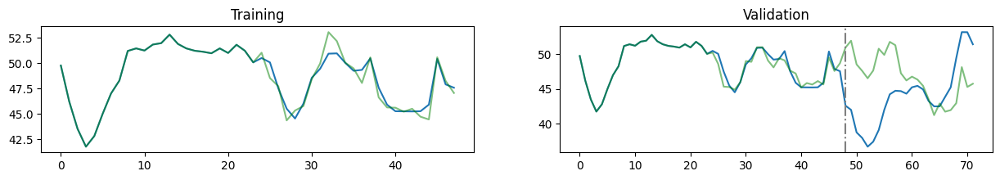

Step: 1 | Iteration 50| Training Loss: 0.17223429679870605 | Validation Loss: 6.157049655914307 | Number of func evals: 62790


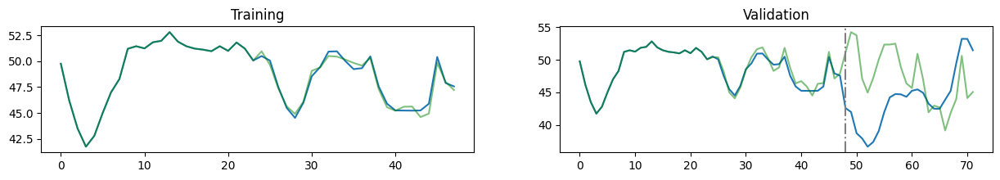

================================================== Window: 1 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 1.498389720916748 | Validation Loss: 3.238560438156128 | Number of func evals: 59636


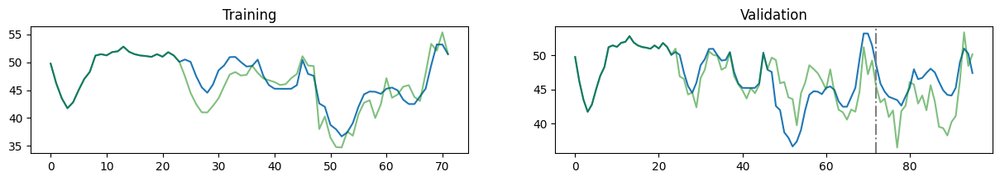

Step: 2 | Iteration 50| Training Loss: 1.2180296182632446 | Validation Loss: 6.3880462646484375 | Number of func evals: 135078


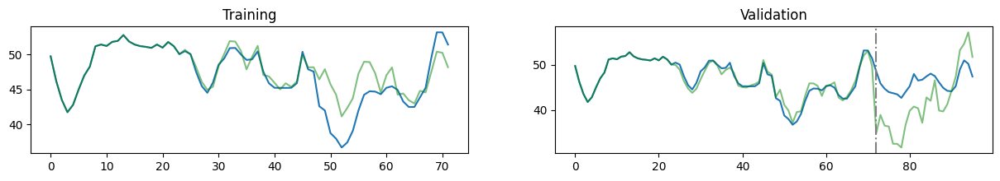

================================================== Window: 1 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 1.0770587921142578 | Validation Loss: 7.95109224319458 | Number of func evals: 95528


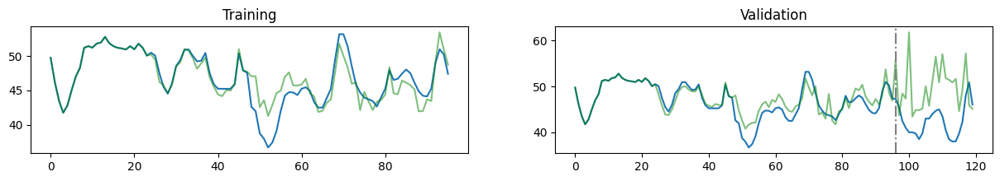

Step: 3 | Iteration 50| Training Loss: 1.0362757444381714 | Validation Loss: 2.4886066913604736 | Number of func evals: 203800


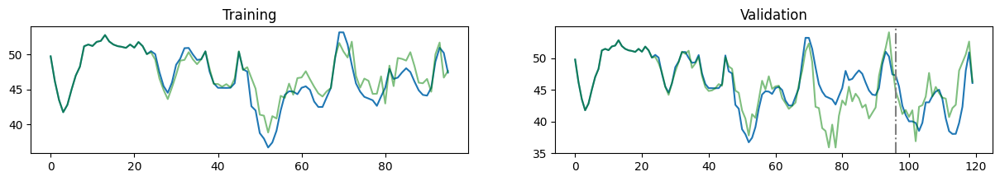

================================================== Window: 1 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 1.2870311737060547 | Validation Loss: 6.191469669342041 | Number of func evals: 120012


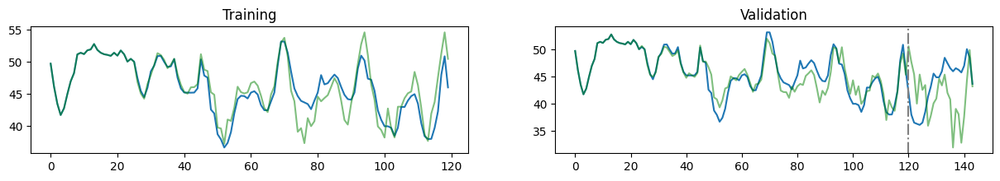

Step: 4 | Iteration 50| Training Loss: 0.9081694483757019 | Validation Loss: 6.188390731811523 | Number of func evals: 251558


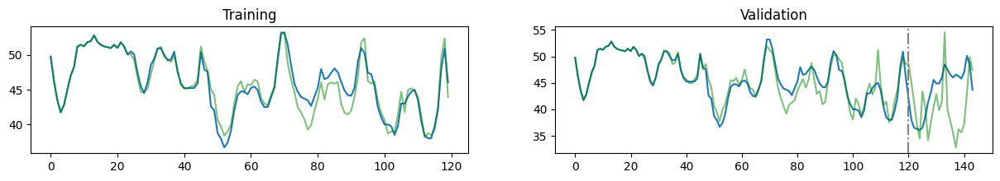

================================================== Window: 1 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.360525131225586 | Validation Loss: 1.7345404624938965 | Number of func evals: 149238


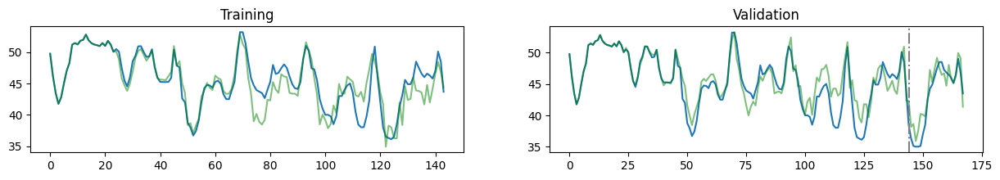

Step: 5 | Iteration 50| Training Loss: 1.1904511451721191 | Validation Loss: 2.984553098678589 | Number of func evals: 305670


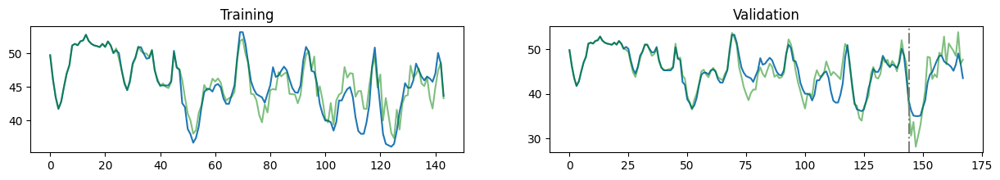

================================================== Window: 1 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.2262940406799316 | Validation Loss: 3.2746989727020264 | Number of func evals: 175318


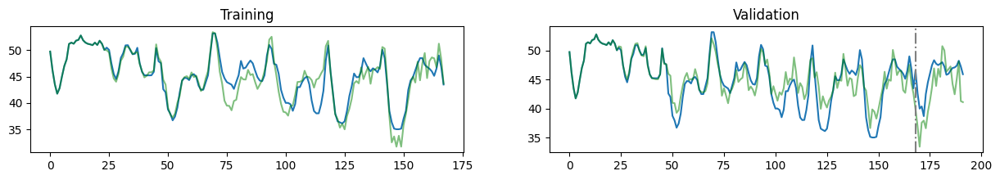

Step: 6 | Iteration 50| Training Loss: 1.0642412900924683 | Validation Loss: 3.9428679943084717 | Number of func evals: 349344


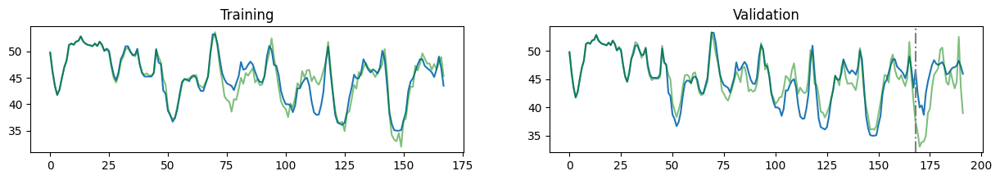

================================================== Window: 2 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 1.7089520692825317 | Validation Loss: 3.938387632369995 | Number of func evals: 48010


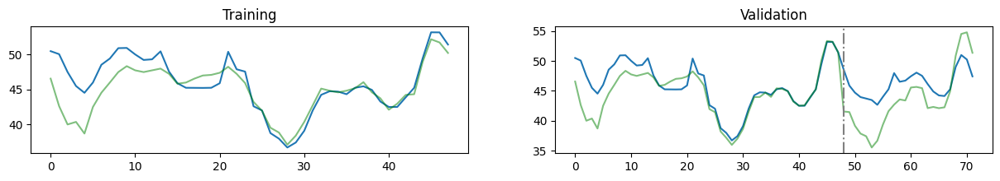

Step: 1 | Iteration 50| Training Loss: 1.5032511949539185 | Validation Loss: 3.1642959117889404 | Number of func evals: 100520


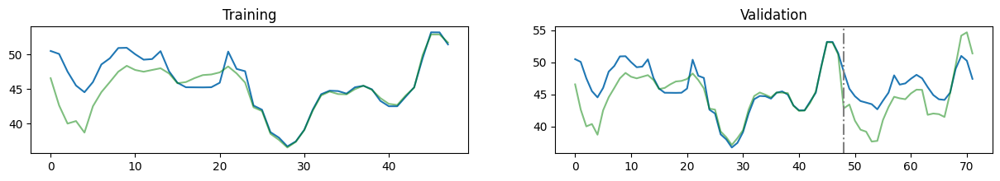

================================================== Window: 2 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 1.2440522909164429 | Validation Loss: 4.3785786628723145 | Number of func evals: 96342


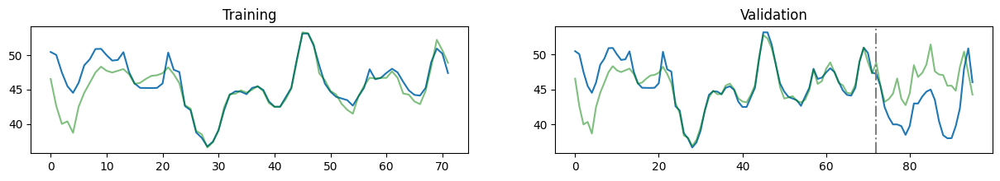

Step: 2 | Iteration 50| Training Loss: 1.188230037689209 | Validation Loss: 3.420095205307007 | Number of func evals: 201116


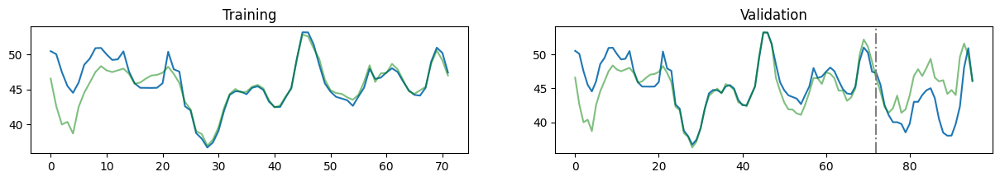

================================================== Window: 2 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 1.3016258478164673 | Validation Loss: 3.9766416549682617 | Number of func evals: 127892


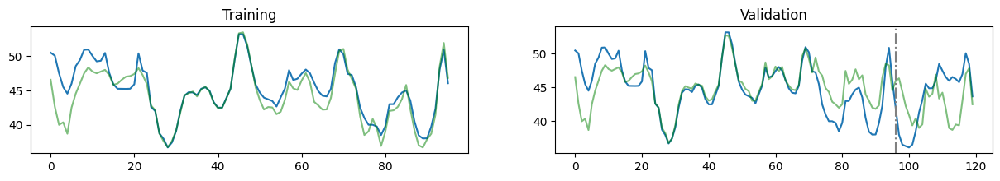

Step: 3 | Iteration 50| Training Loss: 1.2447419166564941 | Validation Loss: 5.428167819976807 | Number of func evals: 263164


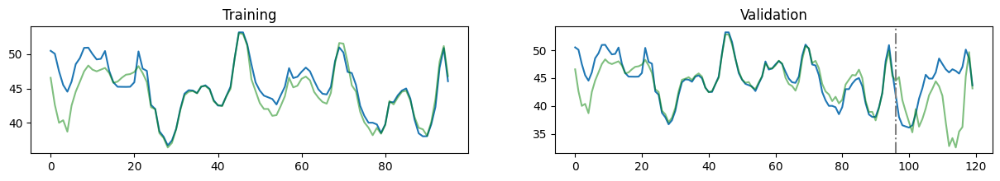

================================================== Window: 2 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 1.3819677829742432 | Validation Loss: 3.4633493423461914 | Number of func evals: 148322


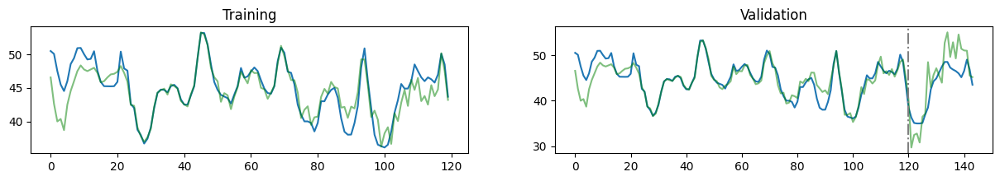

Step: 4 | Iteration 50| Training Loss: 1.3943617343902588 | Validation Loss: 1.6380747556686401 | Number of func evals: 309502


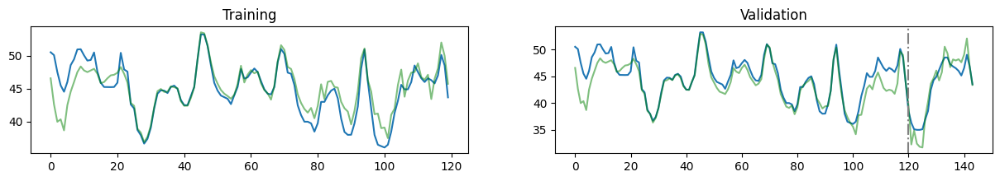

================================================== Window: 2 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.3271898031234741 | Validation Loss: 3.8700063228607178 | Number of func evals: 180702


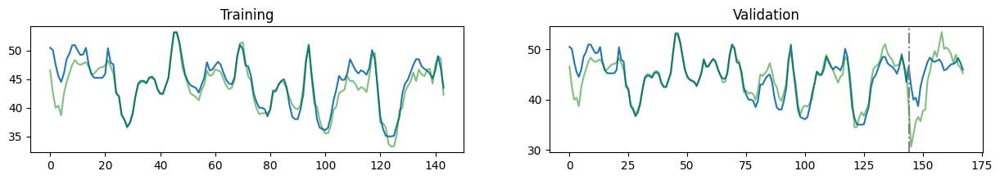

Step: 5 | Iteration 50| Training Loss: 1.1642320156097412 | Validation Loss: 4.3316521644592285 | Number of func evals: 363922


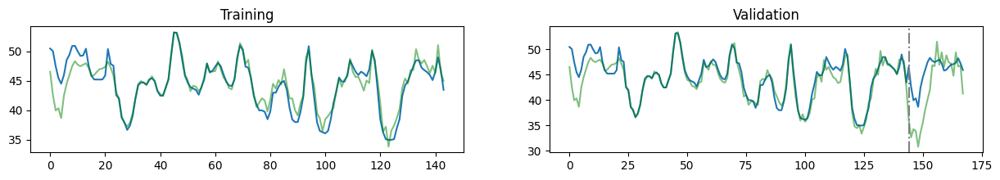

================================================== Window: 2 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.2741807699203491 | Validation Loss: 6.722104549407959 | Number of func evals: 197684


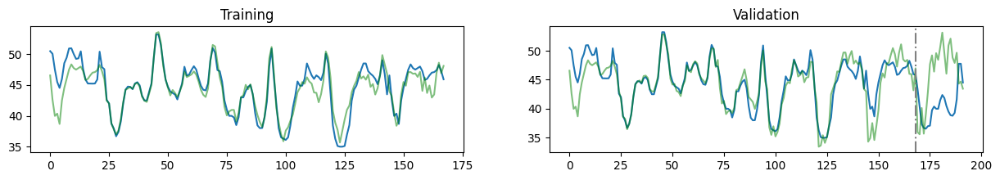

Step: 6 | Iteration 50| Training Loss: 1.1490503549575806 | Validation Loss: 5.816127300262451 | Number of func evals: 408190


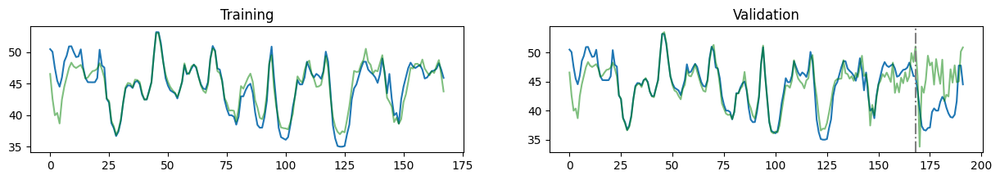

================================================== Window: 3 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 2.4191408157348633 | Validation Loss: 3.744530439376831 | Number of func evals: 40526


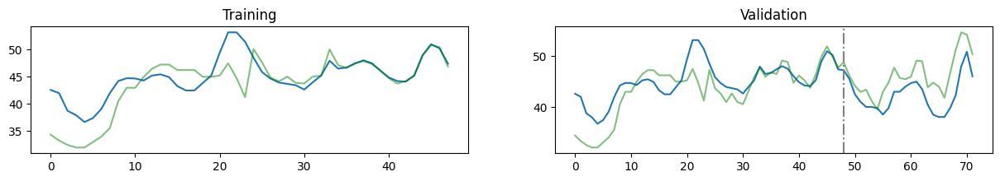

Step: 1 | Iteration 50| Training Loss: 2.4659230709075928 | Validation Loss: 3.7363274097442627 | Number of func evals: 82632


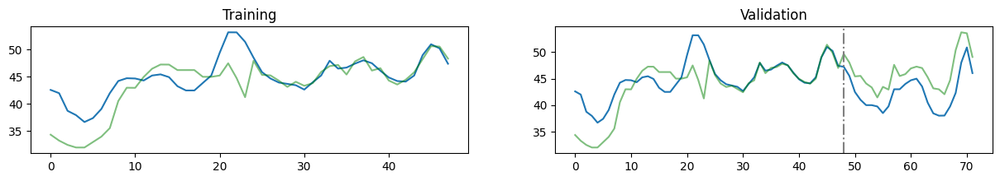

================================================== Window: 3 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 2.132380485534668 | Validation Loss: 5.467653751373291 | Number of func evals: 95382


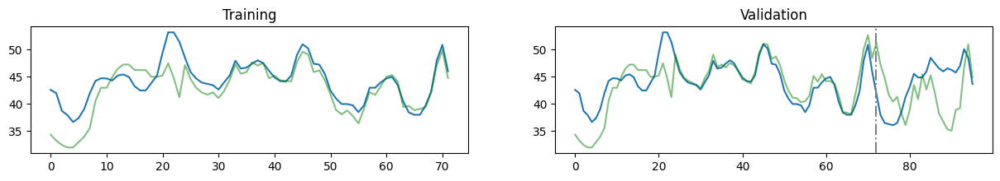

Step: 2 | Iteration 50| Training Loss: 2.014908790588379 | Validation Loss: 5.755040645599365 | Number of func evals: 197506


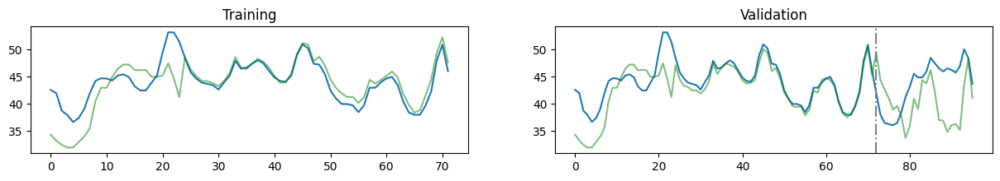

================================================== Window: 3 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 1.7533396482467651 | Validation Loss: 2.32924747467041 | Number of func evals: 133664


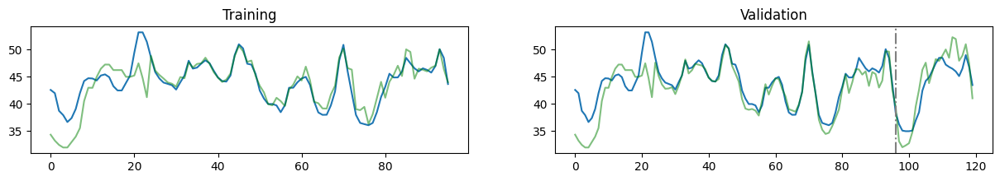

Step: 3 | Iteration 50| Training Loss: 1.6259857416152954 | Validation Loss: 1.4303873777389526 | Number of func evals: 283248


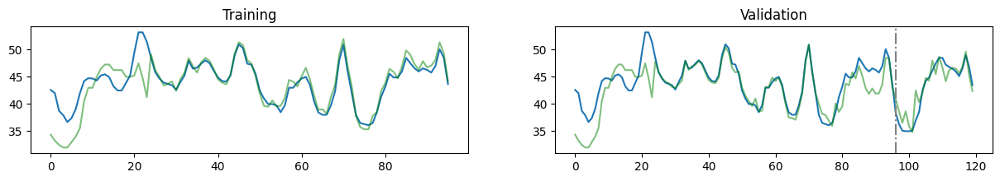

================================================== Window: 3 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 1.5730060338974 | Validation Loss: 3.9124228954315186 | Number of func evals: 170216


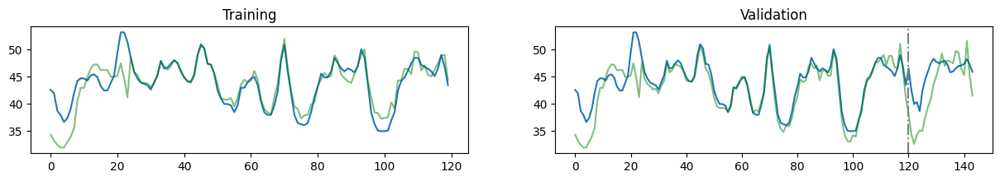

Step: 4 | Iteration 50| Training Loss: 1.3673874139785767 | Validation Loss: 2.2852113246917725 | Number of func evals: 344390


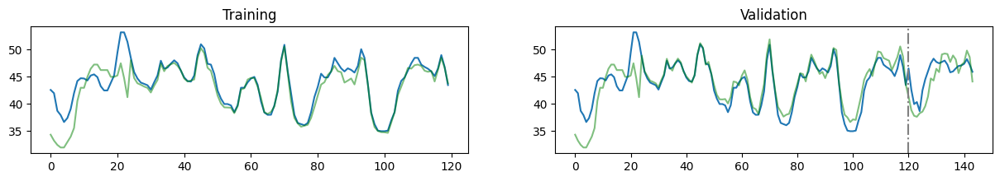

================================================== Window: 3 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.5419328212738037 | Validation Loss: 5.861793518066406 | Number of func evals: 196690


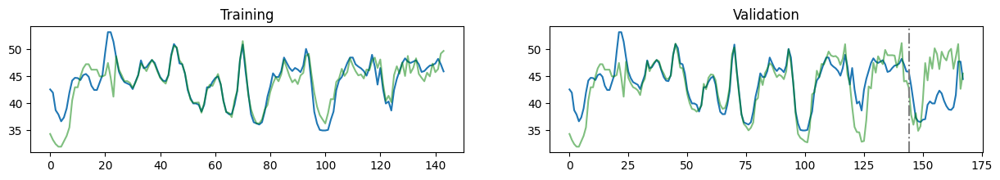

Step: 5 | Iteration 50| Training Loss: 1.3959170579910278 | Validation Loss: 8.50797176361084 | Number of func evals: 393132


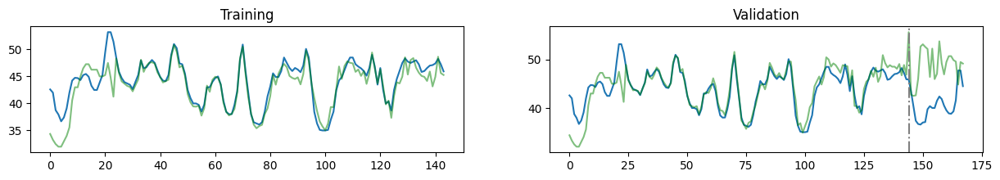

================================================== Window: 3 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.7450863122940063 | Validation Loss: 2.6433632373809814 | Number of func evals: 217918


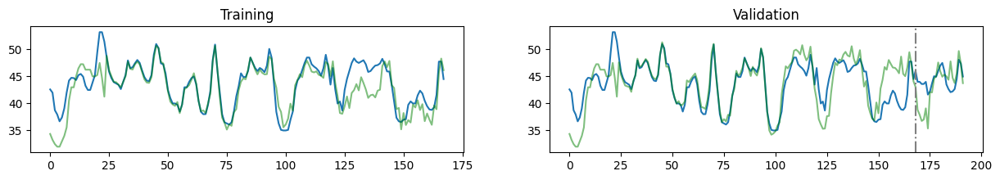

Step: 6 | Iteration 50| Training Loss: 1.524836778640747 | Validation Loss: 6.447139739990234 | Number of func evals: 452140


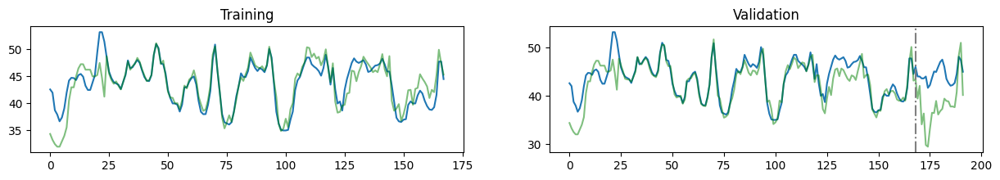

================================================== Window: 4 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 2.846994638442993 | Validation Loss: 1.8004512786865234 | Number of func evals: 68644


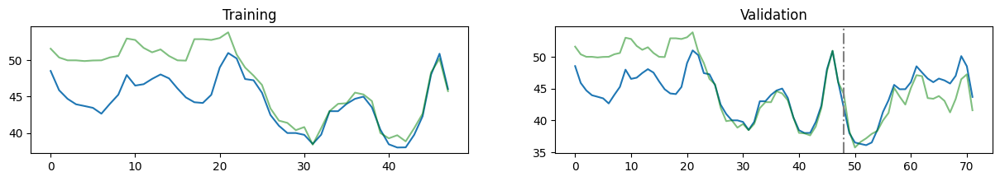

Step: 1 | Iteration 50| Training Loss: 2.8153092861175537 | Validation Loss: 1.6698331832885742 | Number of func evals: 130646


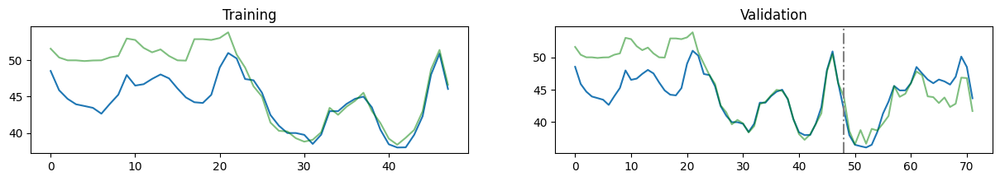

================================================== Window: 4 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 2.2105963230133057 | Validation Loss: 0.9194100499153137 | Number of func evals: 109396


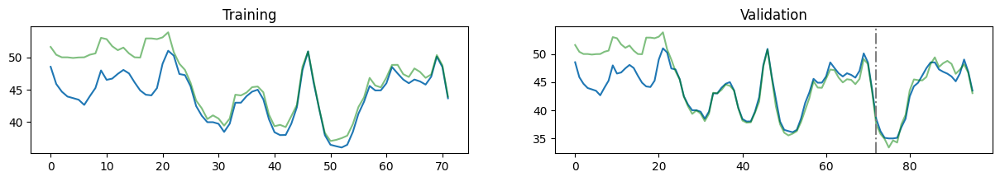

Step: 2 | Iteration 50| Training Loss: 2.1215827465057373 | Validation Loss: 1.2142667770385742 | Number of func evals: 214658


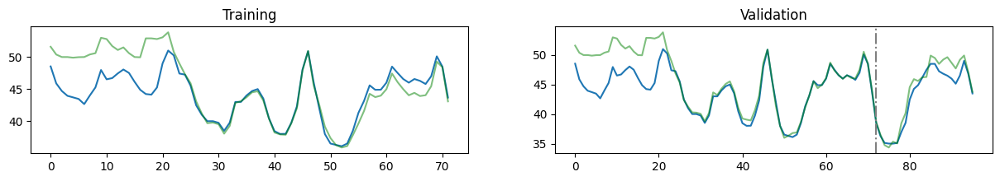

================================================== Window: 4 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 1.631892204284668 | Validation Loss: 2.7543609142303467 | Number of func evals: 131274


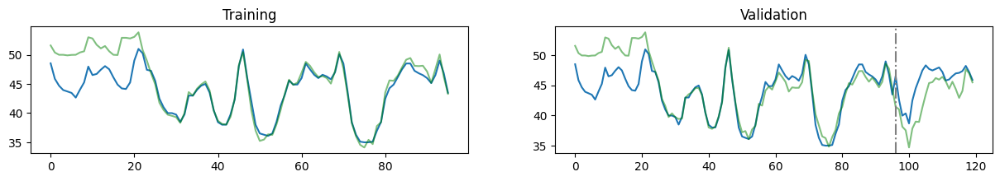

Step: 3 | Iteration 50| Training Loss: 1.7421880960464478 | Validation Loss: 3.5162389278411865 | Number of func evals: 261964


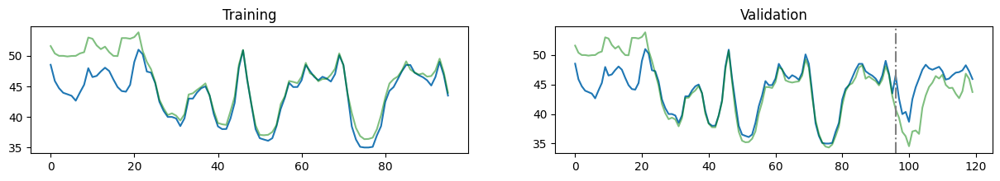

================================================== Window: 4 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 1.5044175386428833 | Validation Loss: 4.045670986175537 | Number of func evals: 152788


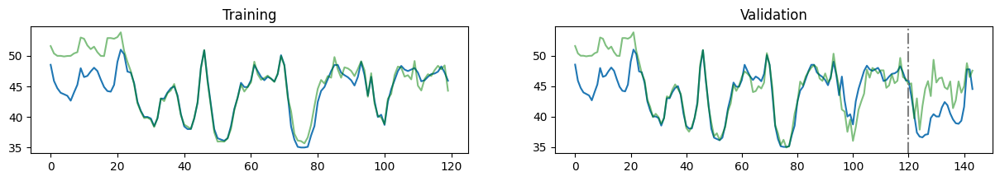

Step: 4 | Iteration 50| Training Loss: 1.6155593395233154 | Validation Loss: 4.013220310211182 | Number of func evals: 314972


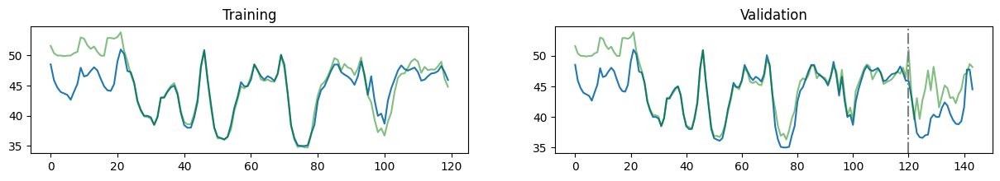

================================================== Window: 4 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.8491919040679932 | Validation Loss: 5.070825576782227 | Number of func evals: 197260


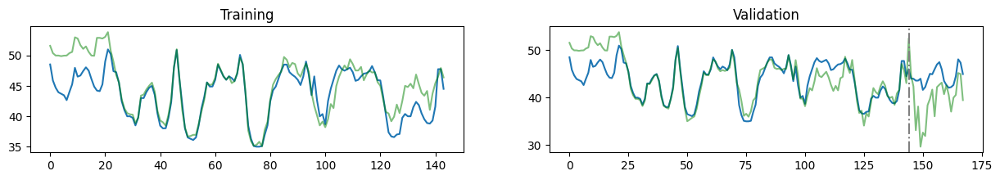

Step: 5 | Iteration 50| Training Loss: 1.6013970375061035 | Validation Loss: 4.966240406036377 | Number of func evals: 411260


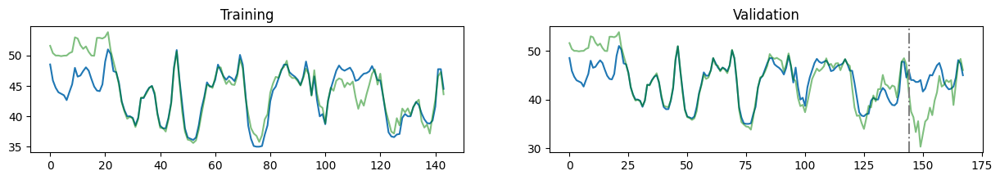

================================================== Window: 4 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.5742201805114746 | Validation Loss: 2.163292169570923 | Number of func evals: 227248


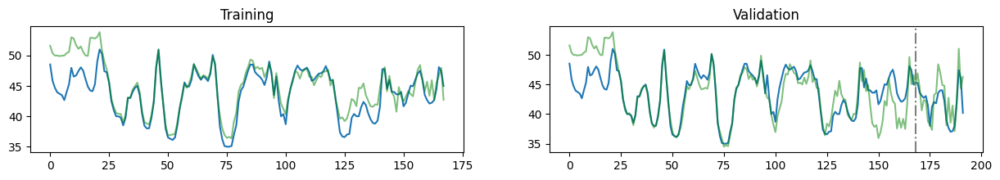

Step: 6 | Iteration 50| Training Loss: 1.4931517839431763 | Validation Loss: 4.575384616851807 | Number of func evals: 466304


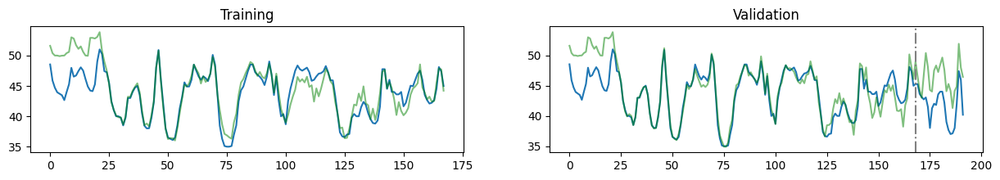

================================================== Window: 5 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 1.9004878997802734 | Validation Loss: 2.302645444869995 | Number of func evals: 23466


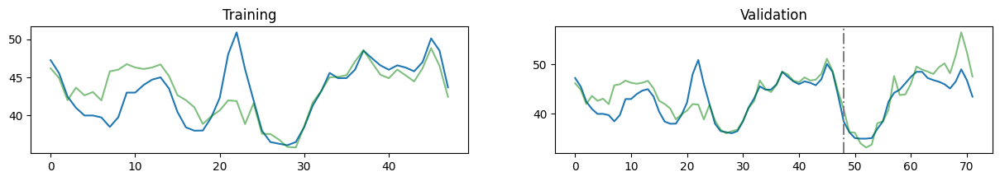

Step: 1 | Iteration 50| Training Loss: 1.8977161645889282 | Validation Loss: 2.16495680809021 | Number of func evals: 43968


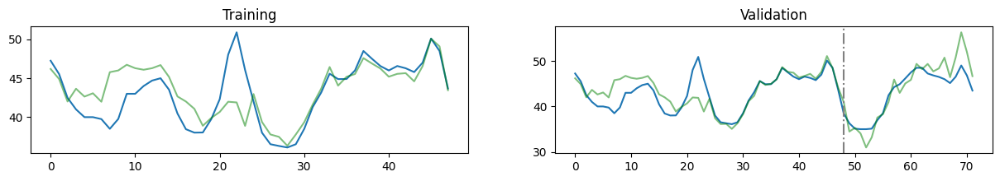

================================================== Window: 5 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 1.5038999319076538 | Validation Loss: 3.8086233139038086 | Number of func evals: 46274


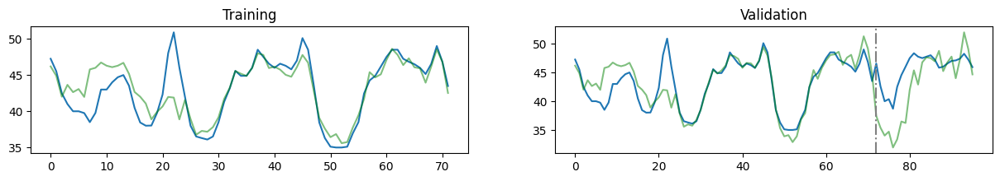

Step: 2 | Iteration 50| Training Loss: 1.343996524810791 | Validation Loss: 3.375967264175415 | Number of func evals: 98780


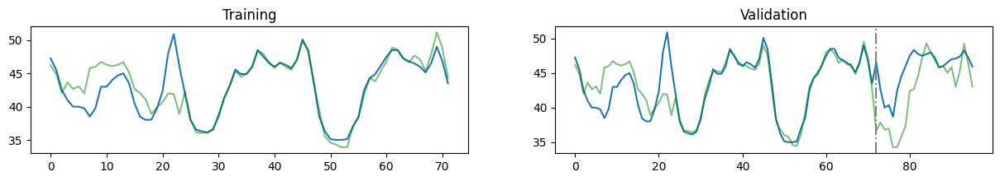

================================================== Window: 5 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 1.3804998397827148 | Validation Loss: 5.886855602264404 | Number of func evals: 87242


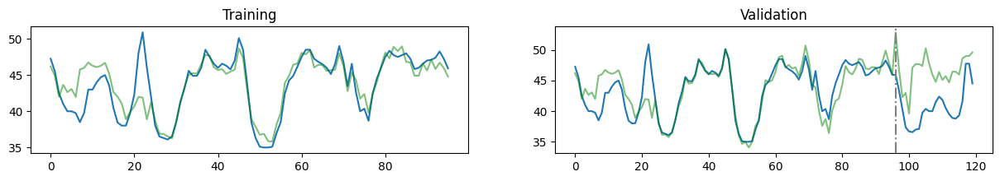

Step: 3 | Iteration 50| Training Loss: 1.2174949645996094 | Validation Loss: 5.175063610076904 | Number of func evals: 181310


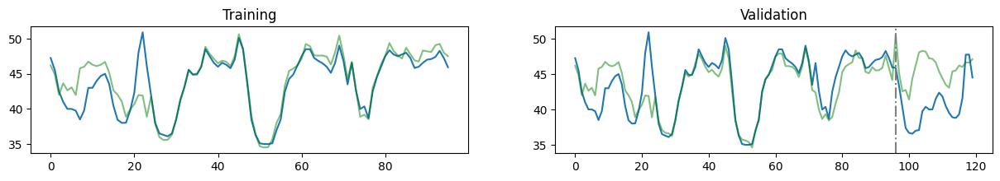

================================================== Window: 5 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 1.1116626262664795 | Validation Loss: 2.9966557025909424 | Number of func evals: 139350


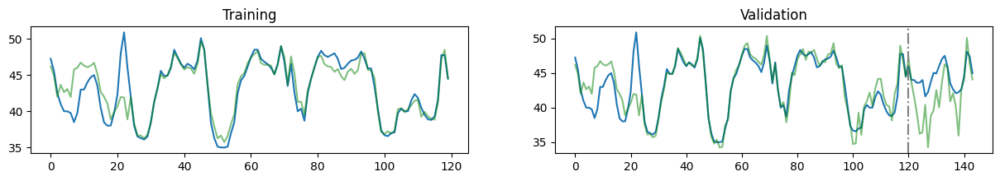

Step: 4 | Iteration 50| Training Loss: 0.9636772274971008 | Validation Loss: 3.223658323287964 | Number of func evals: 285362


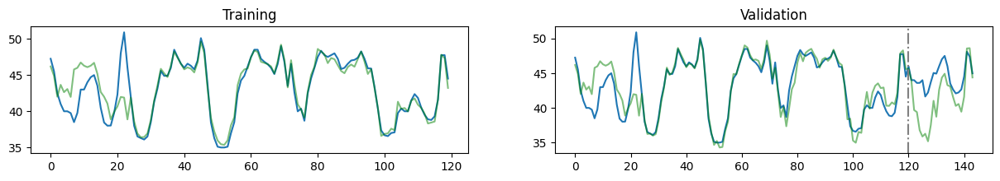

================================================== Window: 5 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.4425220489501953 | Validation Loss: 6.760514736175537 | Number of func evals: 183608


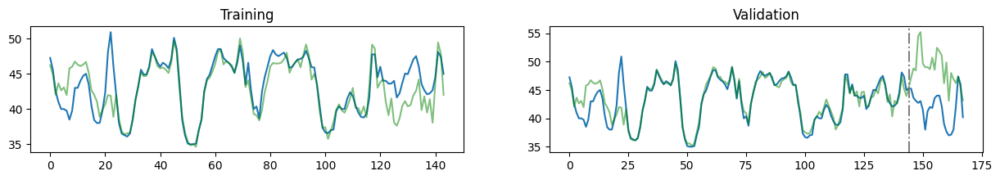

Step: 5 | Iteration 50| Training Loss: 1.0416988134384155 | Validation Loss: 2.8652515411376953 | Number of func evals: 371696


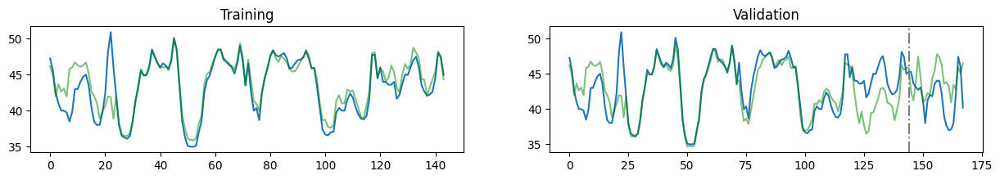

================================================== Window: 5 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.350549340248108 | Validation Loss: 2.9203364849090576 | Number of func evals: 199854


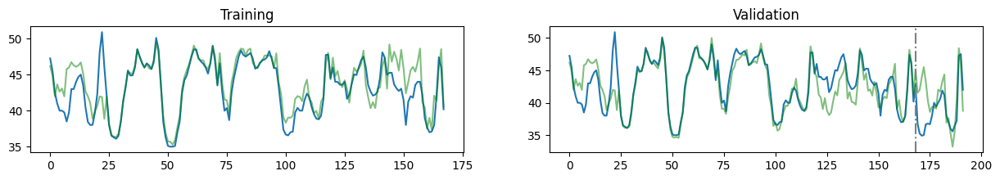

Step: 6 | Iteration 50| Training Loss: 1.2319821119308472 | Validation Loss: 2.7937700748443604 | Number of func evals: 426290


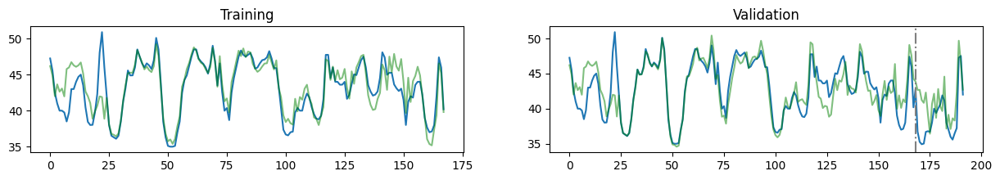

================================================== Window: 6 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 5.030045986175537 | Validation Loss: 3.8307225704193115 | Number of func evals: 51784


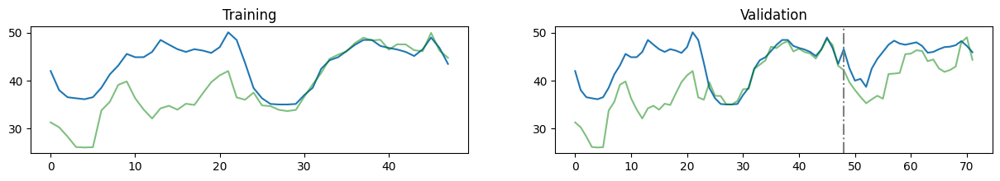

Step: 1 | Iteration 50| Training Loss: 4.98168420791626 | Validation Loss: 3.2999351024627686 | Number of func evals: 109974


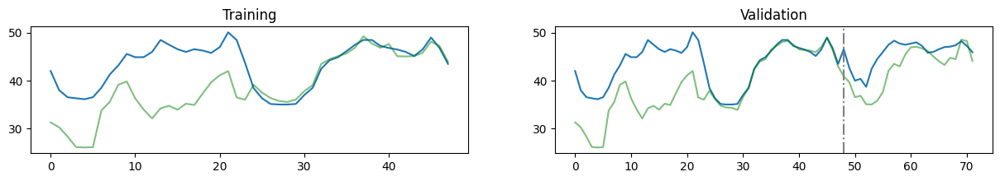

================================================== Window: 6 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 3.5895674228668213 | Validation Loss: 2.1134140491485596 | Number of func evals: 106198


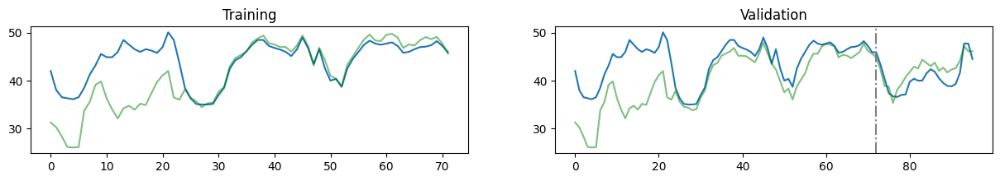

Step: 2 | Iteration 50| Training Loss: 3.4780092239379883 | Validation Loss: 1.6023327112197876 | Number of func evals: 214732


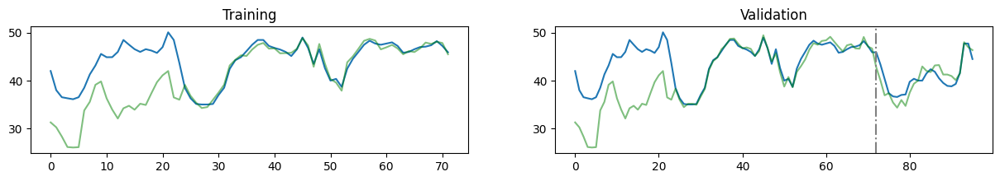

================================================== Window: 6 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 2.7883241176605225 | Validation Loss: 2.847407102584839 | Number of func evals: 152072


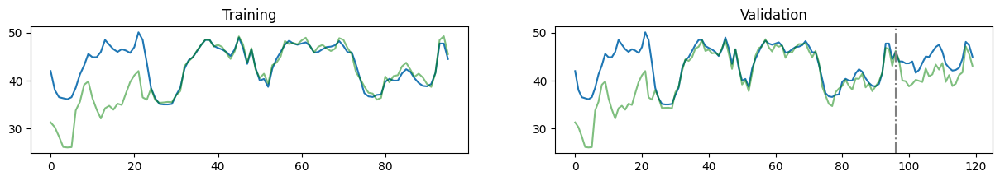

Step: 3 | Iteration 50| Training Loss: 2.8064372539520264 | Validation Loss: 2.501660108566284 | Number of func evals: 304378


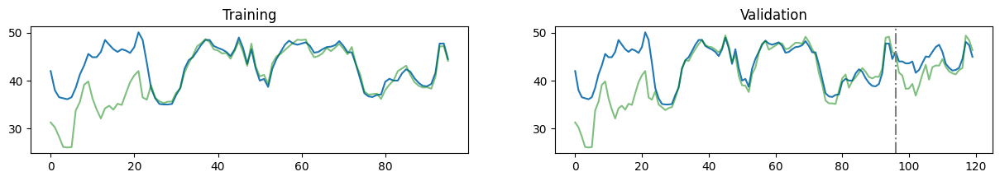

================================================== Window: 6 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 2.399949312210083 | Validation Loss: 1.4400352239608765 | Number of func evals: 185764


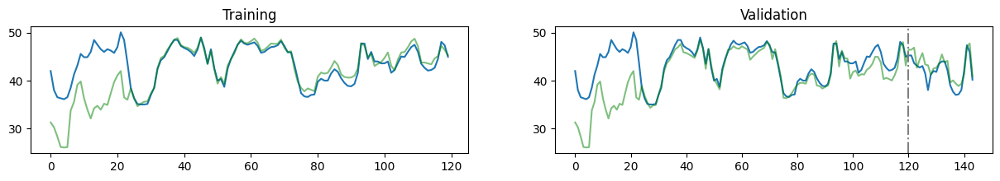

Step: 4 | Iteration 50| Training Loss: 2.3756966590881348 | Validation Loss: 3.040555000305176 | Number of func evals: 372908


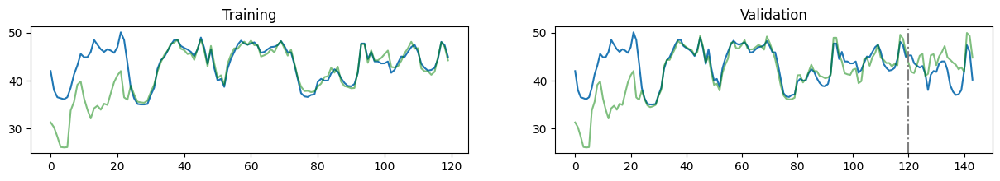

================================================== Window: 6 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 2.198981285095215 | Validation Loss: 3.8384602069854736 | Number of func evals: 218870


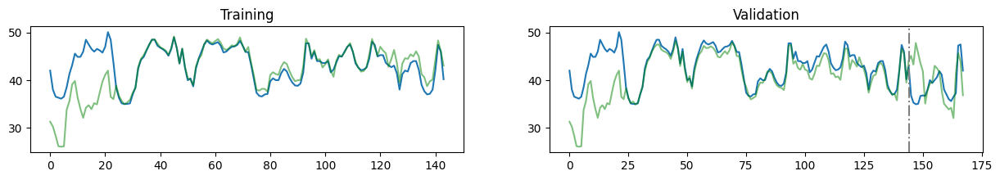

Step: 5 | Iteration 50| Training Loss: 2.0991456508636475 | Validation Loss: 3.4150936603546143 | Number of func evals: 445240


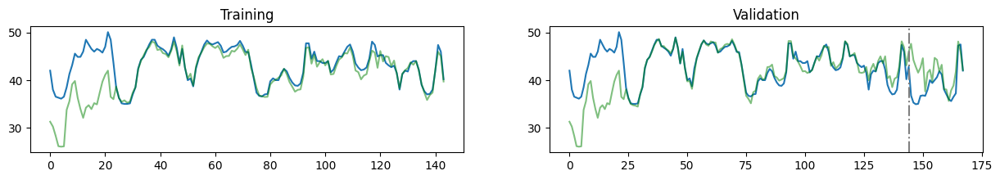

================================================== Window: 6 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 2.0833826065063477 | Validation Loss: 4.296280384063721 | Number of func evals: 234940


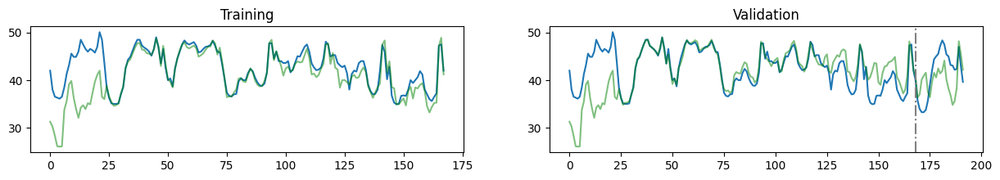

Step: 6 | Iteration 50| Training Loss: 2.0578854084014893 | Validation Loss: 4.1814961433410645 | Number of func evals: 482202


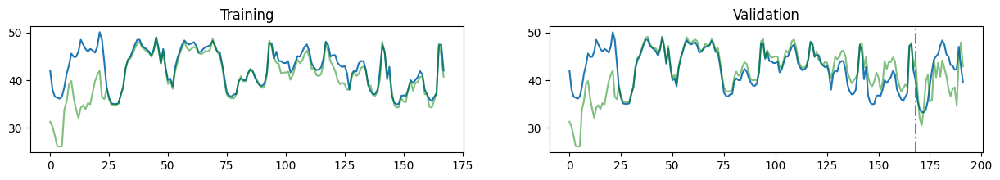

================================================== Window: 7 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 3.9636800289154053 | Validation Loss: 6.5994696617126465 | Number of func evals: 45800


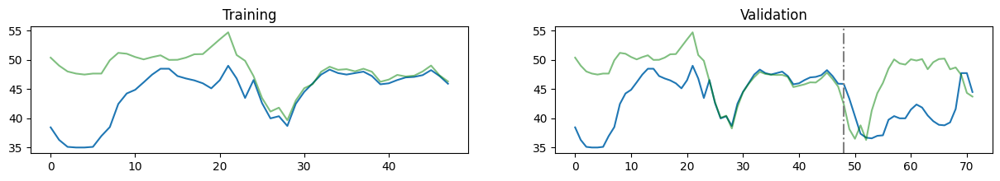

Step: 1 | Iteration 50| Training Loss: 3.756352424621582 | Validation Loss: 6.798635959625244 | Number of func evals: 95244


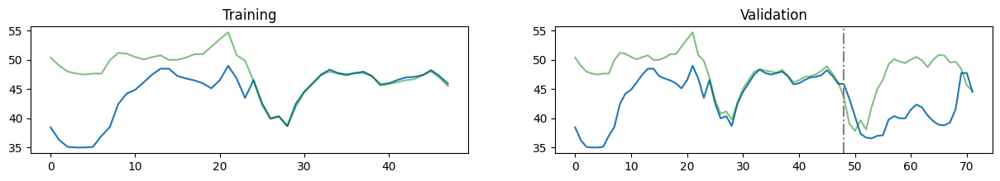

================================================== Window: 7 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 2.8659017086029053 | Validation Loss: 6.913676738739014 | Number of func evals: 77536


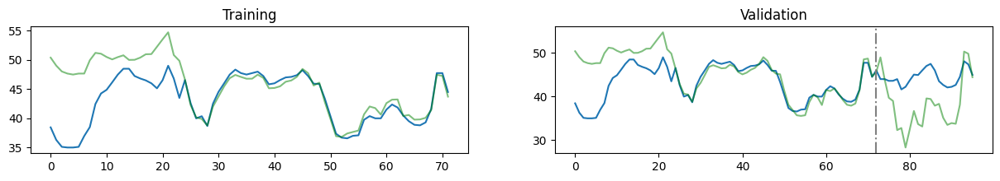

Step: 2 | Iteration 50| Training Loss: 2.792783498764038 | Validation Loss: 6.682548999786377 | Number of func evals: 158260


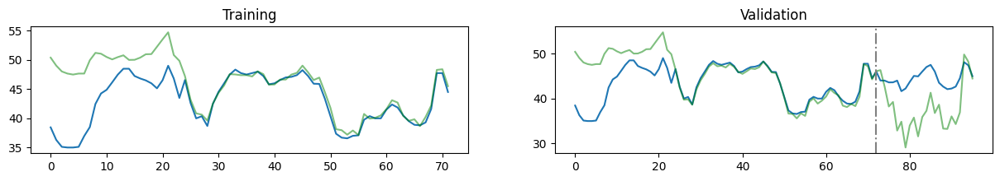

================================================== Window: 7 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 2.437154531478882 | Validation Loss: 2.548635244369507 | Number of func evals: 121128


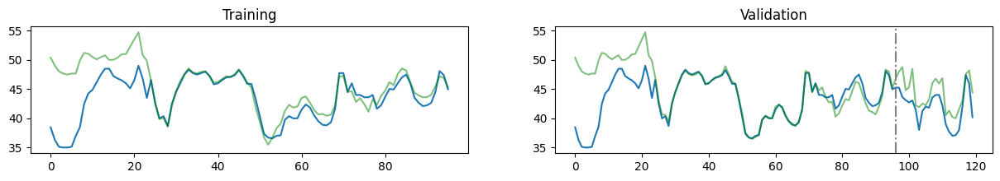

Step: 3 | Iteration 50| Training Loss: 2.2877118587493896 | Validation Loss: 2.945359468460083 | Number of func evals: 248836


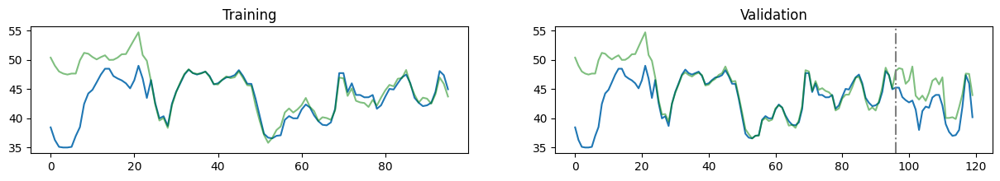

================================================== Window: 7 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 2.311964273452759 | Validation Loss: 3.1951141357421875 | Number of func evals: 153868


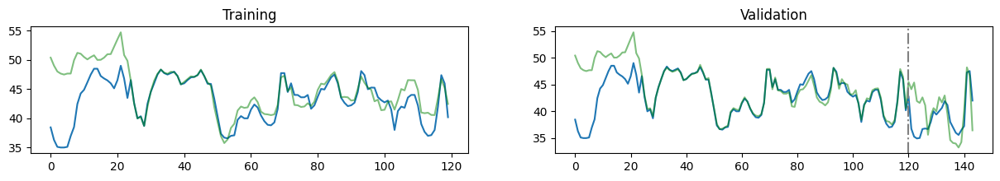

Step: 4 | Iteration 50| Training Loss: 1.994978666305542 | Validation Loss: 3.769623041152954 | Number of func evals: 315598


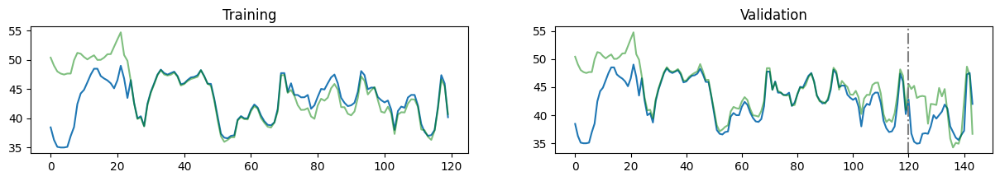

================================================== Window: 7 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.6982213258743286 | Validation Loss: 6.904909133911133 | Number of func evals: 194388


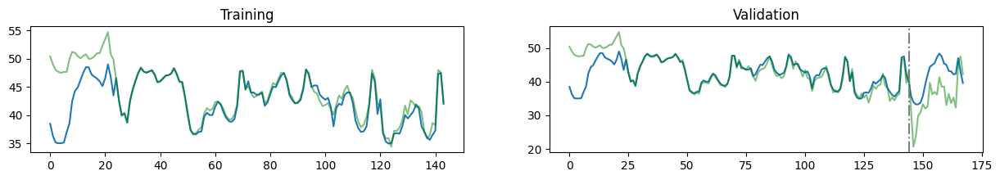

Step: 5 | Iteration 50| Training Loss: 1.8083828687667847 | Validation Loss: 5.695346832275391 | Number of func evals: 396268


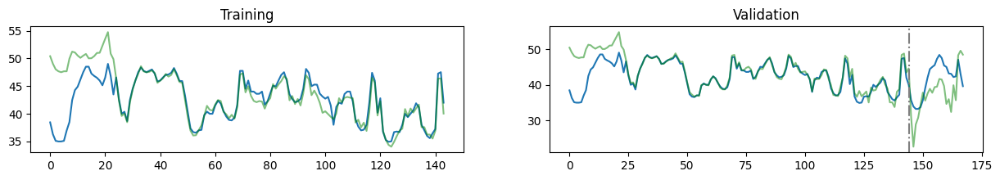

================================================== Window: 7 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.8718632459640503 | Validation Loss: 5.044733047485352 | Number of func evals: 218484


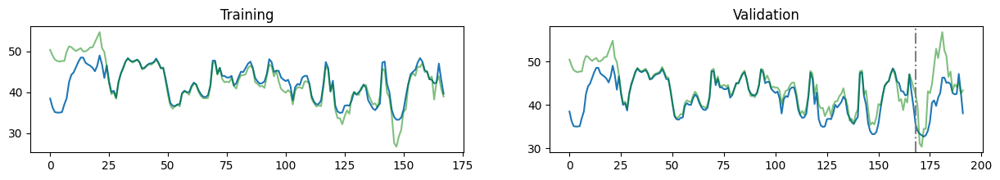

Step: 6 | Iteration 50| Training Loss: 1.8856329917907715 | Validation Loss: 4.58310079574585 | Number of func evals: 454574


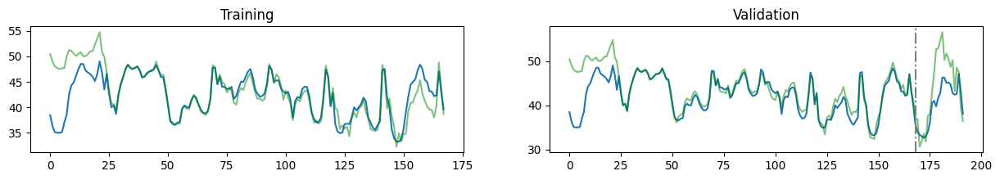

================================================== Window: 8 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 1.839682936668396 | Validation Loss: 4.177764415740967 | Number of func evals: 36430


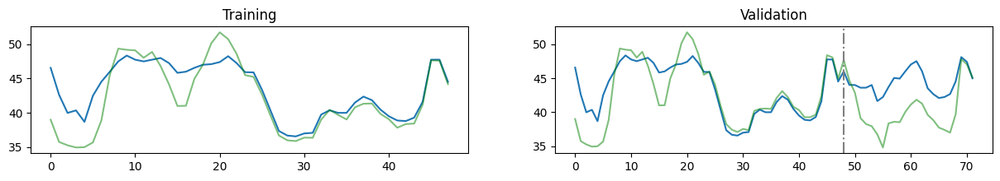

Step: 1 | Iteration 50| Training Loss: 1.8364375829696655 | Validation Loss: 4.238434314727783 | Number of func evals: 76108


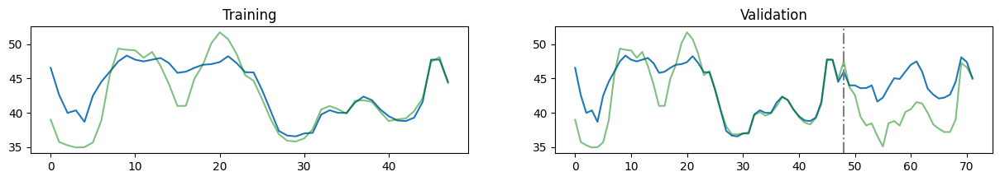

================================================== Window: 8 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 1.3886476755142212 | Validation Loss: 1.8783725500106812 | Number of func evals: 104816


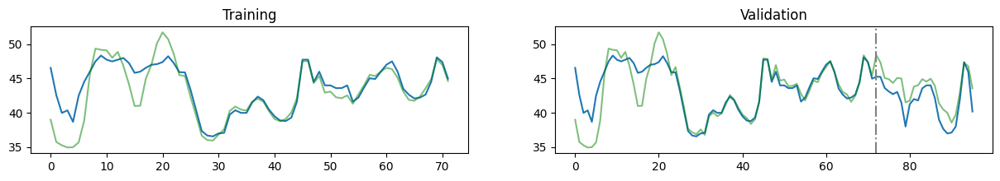

Step: 2 | Iteration 50| Training Loss: 1.4275449514389038 | Validation Loss: 1.9450769424438477 | Number of func evals: 210606


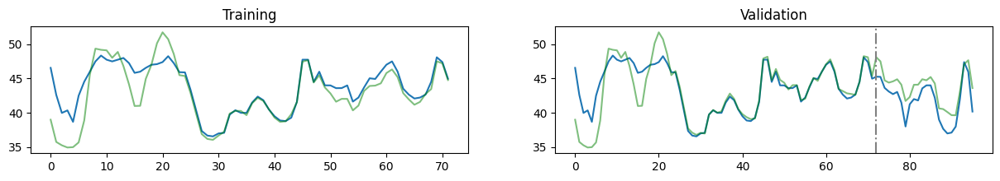

================================================== Window: 8 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 1.0606046915054321 | Validation Loss: 1.9114662408828735 | Number of func evals: 153708


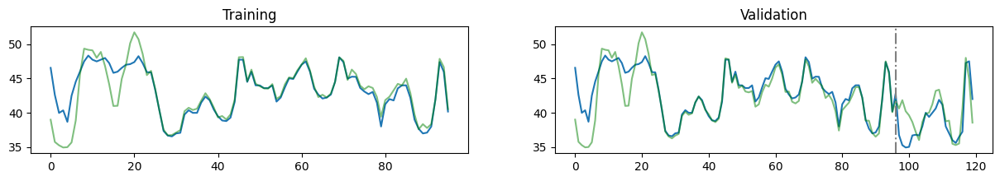

Step: 3 | Iteration 50| Training Loss: 1.0979094505310059 | Validation Loss: 1.9139117002487183 | Number of func evals: 306132


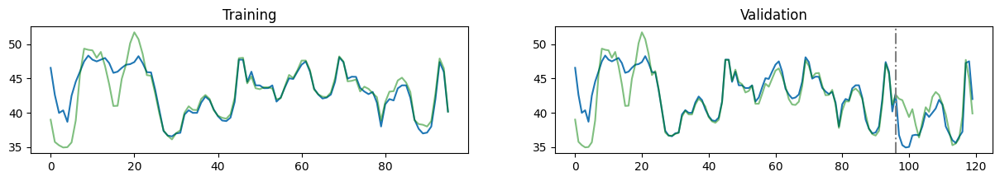

================================================== Window: 8 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 0.9367392063140869 | Validation Loss: 3.9000940322875977 | Number of func evals: 177922


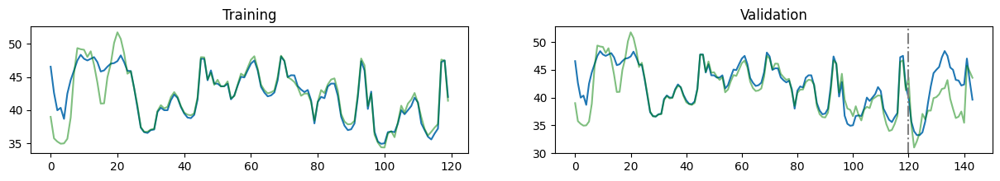

Step: 4 | Iteration 50| Training Loss: 1.154253602027893 | Validation Loss: 1.8638591766357422 | Number of func evals: 357692


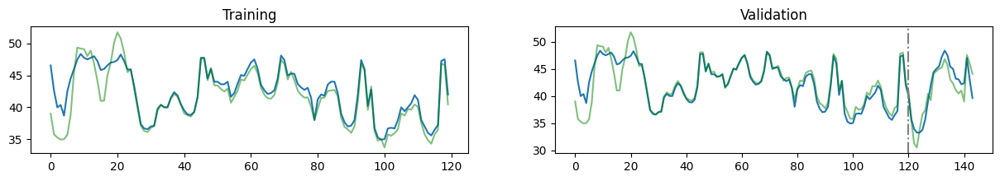

================================================== Window: 8 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.3384865522384644 | Validation Loss: 3.2511110305786133 | Number of func evals: 212594


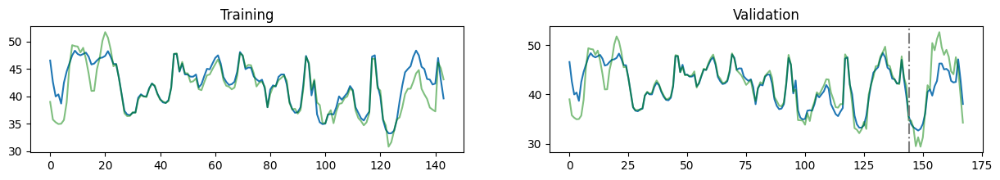

Step: 5 | Iteration 50| Training Loss: 0.9923398494720459 | Validation Loss: 3.696648597717285 | Number of func evals: 434918


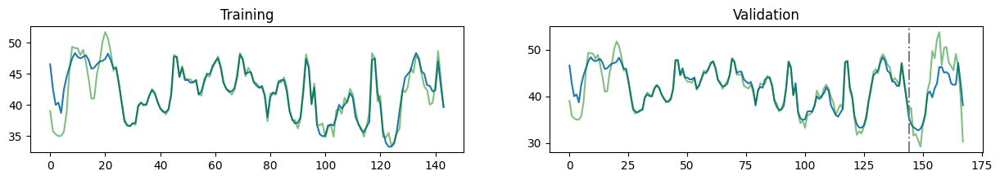

================================================== Window: 8 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.0132404565811157 | Validation Loss: 3.1839849948883057 | Number of func evals: 236512


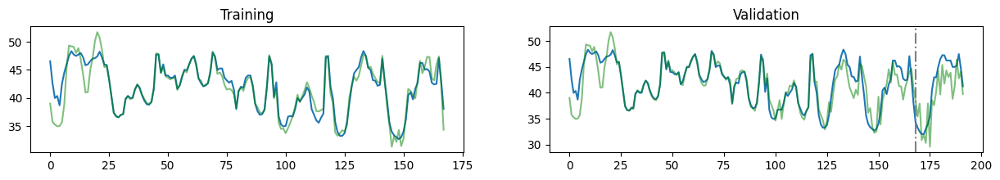

Step: 6 | Iteration 50| Training Loss: 1.13626229763031 | Validation Loss: 1.9381266832351685 | Number of func evals: 483666


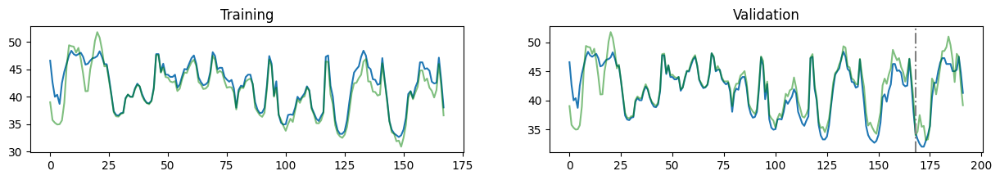

================================================== Window: 9 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 2.9898416996002197 | Validation Loss: 4.45298957824707 | Number of func evals: 62540


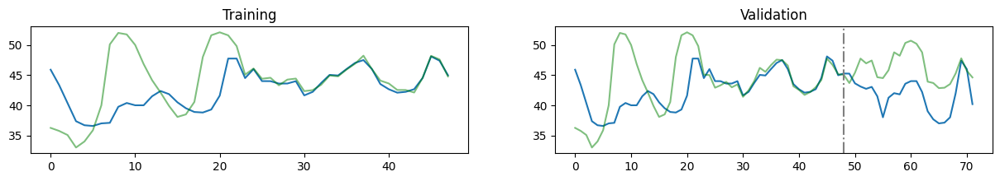

Step: 1 | Iteration 50| Training Loss: 3.0090770721435547 | Validation Loss: 4.145379066467285 | Number of func evals: 131494


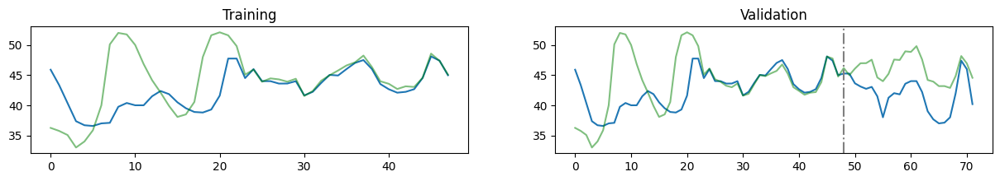

================================================== Window: 9 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 2.2073681354522705 | Validation Loss: 2.328787088394165 | Number of func evals: 108286


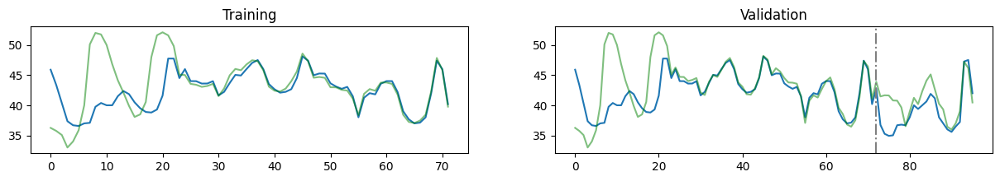

Step: 2 | Iteration 50| Training Loss: 2.107022285461426 | Validation Loss: 2.618833541870117 | Number of func evals: 222368


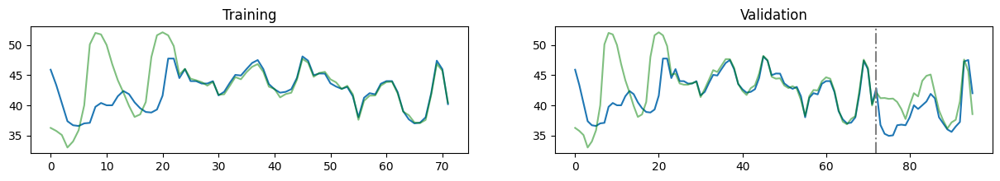

================================================== Window: 9 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 1.820123314857483 | Validation Loss: 1.5198317766189575 | Number of func evals: 147724


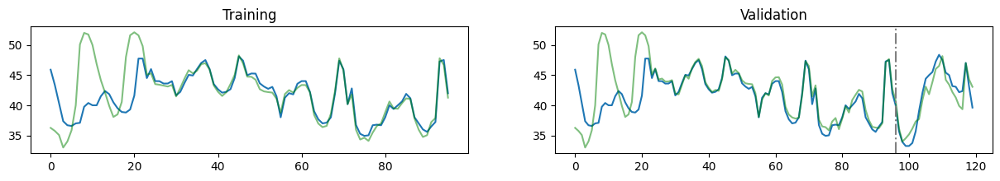

Step: 3 | Iteration 50| Training Loss: 1.7995953559875488 | Validation Loss: 2.136488914489746 | Number of func evals: 294218


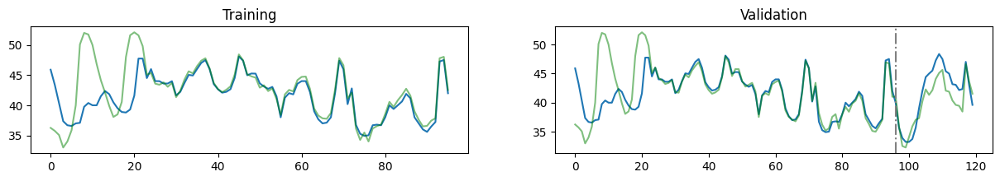

================================================== Window: 9 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 1.4877245426177979 | Validation Loss: 1.9754085540771484 | Number of func evals: 185086


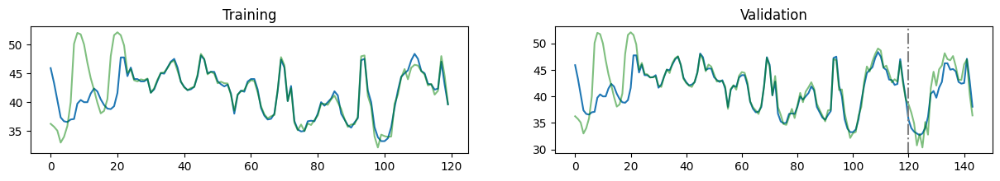

Step: 4 | Iteration 50| Training Loss: 1.4846878051757812 | Validation Loss: 2.205477714538574 | Number of func evals: 373226


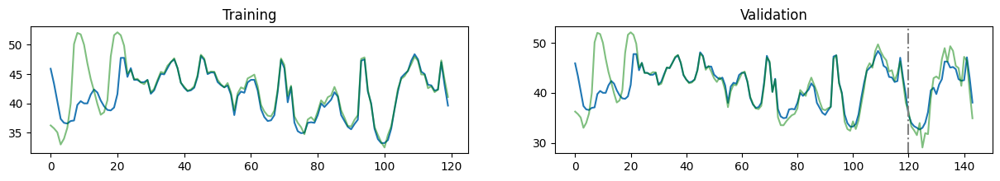

================================================== Window: 9 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.4820629358291626 | Validation Loss: 3.3982505798339844 | Number of func evals: 212126


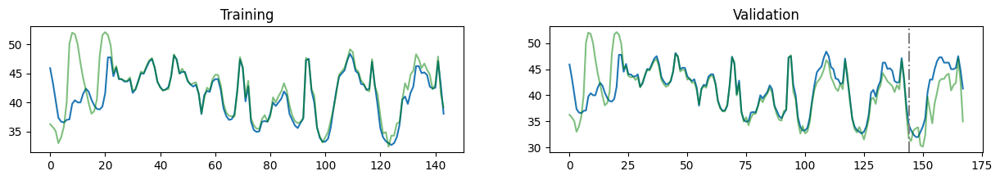

Step: 5 | Iteration 50| Training Loss: 1.6017042398452759 | Validation Loss: 2.0734851360321045 | Number of func evals: 420402


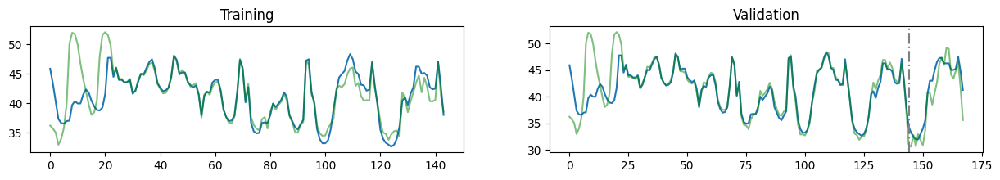

================================================== Window: 9 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.488097906112671 | Validation Loss: 2.113123655319214 | Number of func evals: 232506


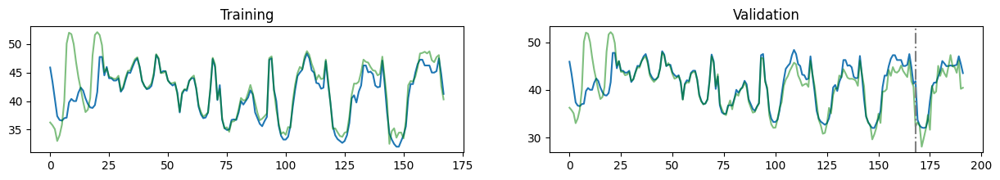

Step: 6 | Iteration 50| Training Loss: 1.535353183746338 | Validation Loss: 2.4312994480133057 | Number of func evals: 478060


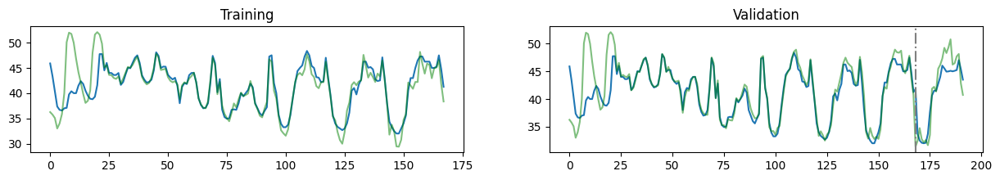

================================================== Window: 10 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 2.286538600921631 | Validation Loss: 2.524690866470337 | Number of func evals: 72878


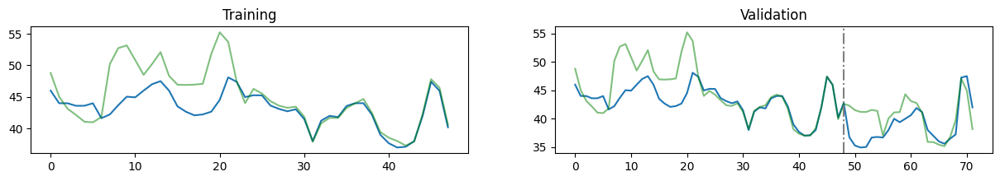

Step: 1 | Iteration 50| Training Loss: 2.3031599521636963 | Validation Loss: 2.4113540649414062 | Number of func evals: 148510


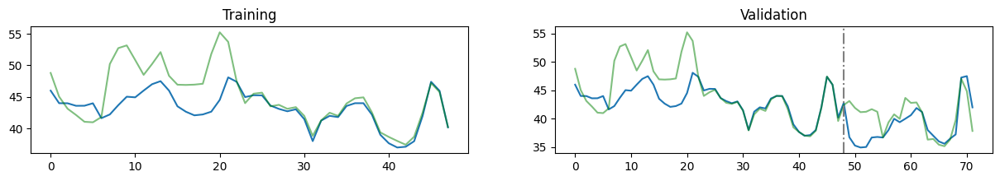

================================================== Window: 10 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 1.6269313097000122 | Validation Loss: 0.6796474456787109 | Number of func evals: 115896


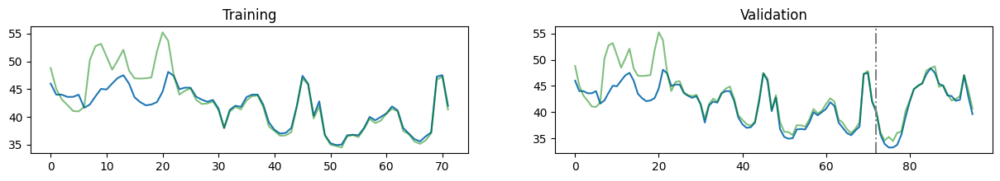

Step: 2 | Iteration 50| Training Loss: 1.6621137857437134 | Validation Loss: 0.5950350761413574 | Number of func evals: 237356


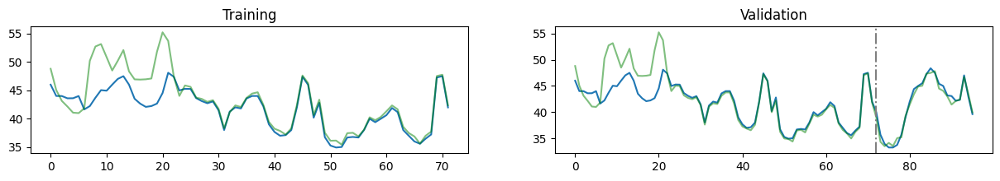

================================================== Window: 10 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 1.4673758745193481 | Validation Loss: 1.1329389810562134 | Number of func evals: 149998


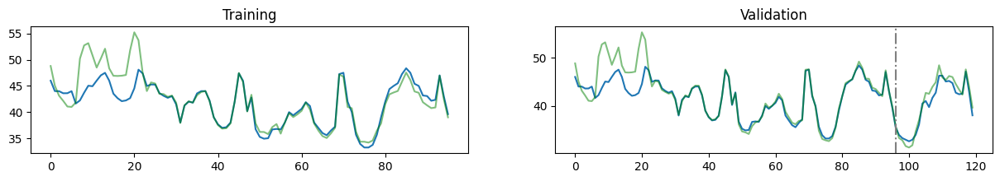

Step: 3 | Iteration 50| Training Loss: 1.3195661306381226 | Validation Loss: 1.149652123451233 | Number of func evals: 302274


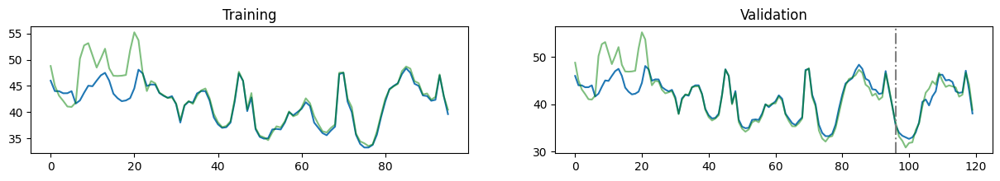

================================================== Window: 10 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 1.2291998863220215 | Validation Loss: 1.8734798431396484 | Number of func evals: 192008


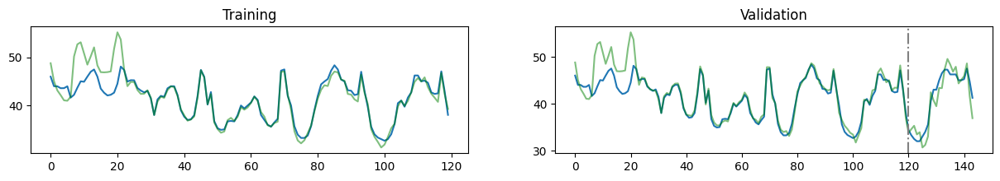

Step: 4 | Iteration 50| Training Loss: 1.2969998121261597 | Validation Loss: 1.5756139755249023 | Number of func evals: 386172


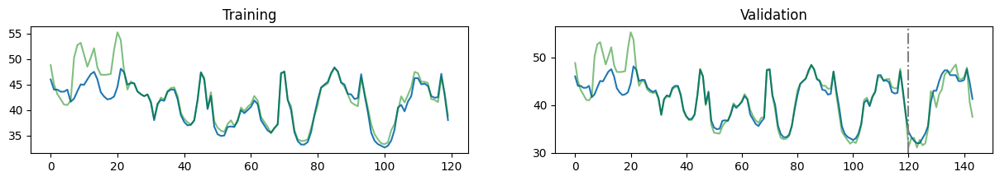

================================================== Window: 10 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.1391551494598389 | Validation Loss: 1.6980571746826172 | Number of func evals: 211134


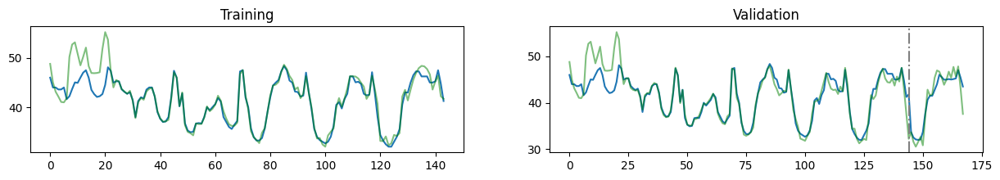

Step: 5 | Iteration 50| Training Loss: 1.2968477010726929 | Validation Loss: 2.4812252521514893 | Number of func evals: 426356


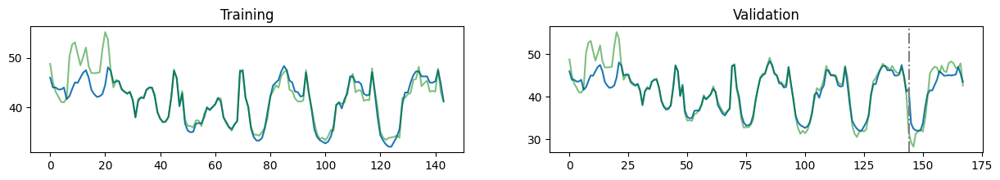

================================================== Window: 10 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.189496397972107 | Validation Loss: 2.667682409286499 | Number of func evals: 230210


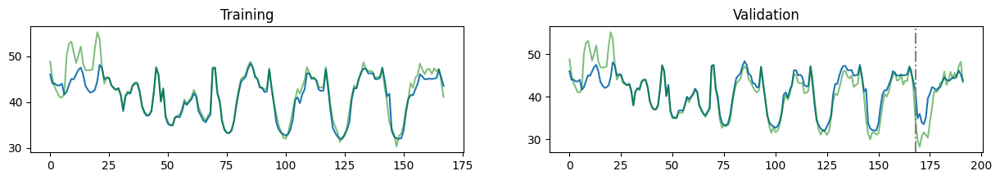

Step: 6 | Iteration 50| Training Loss: 1.2273021936416626 | Validation Loss: 2.7017781734466553 | Number of func evals: 471472


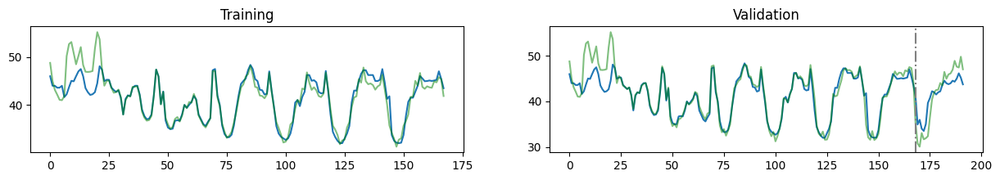

================================================== Window: 11 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 3.6570749282836914 | Validation Loss: 4.712325096130371 | Number of func evals: 70290


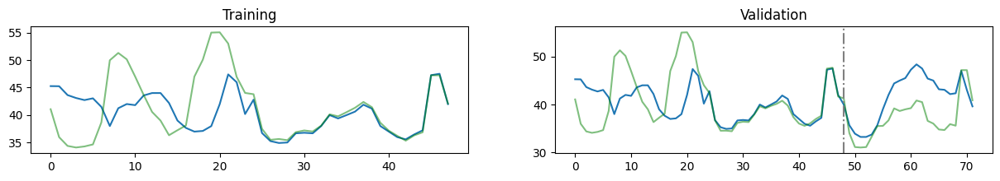

Step: 1 | Iteration 50| Training Loss: 3.6424458026885986 | Validation Loss: 4.493945598602295 | Number of func evals: 145814


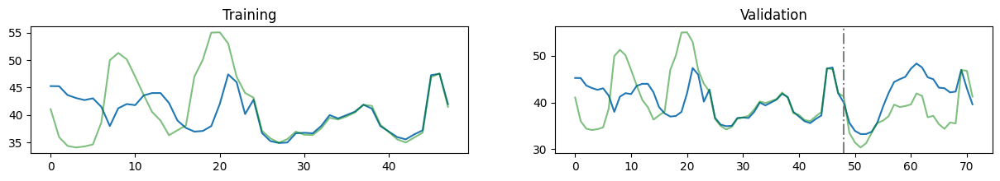

================================================== Window: 11 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 2.60347843170166 | Validation Loss: 1.2569118738174438 | Number of func evals: 115856


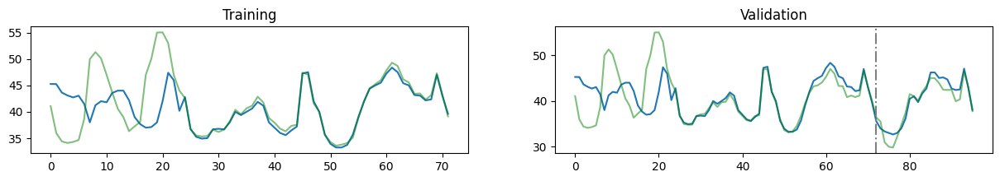

Step: 2 | Iteration 50| Training Loss: 2.720637083053589 | Validation Loss: 1.1238981485366821 | Number of func evals: 239534


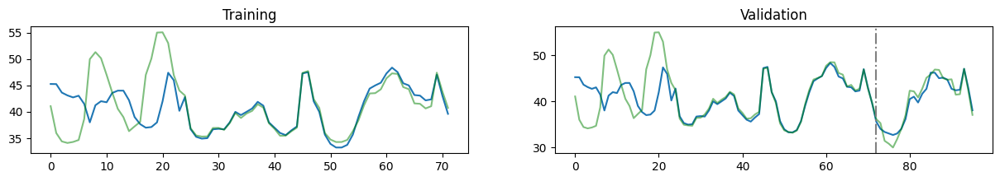

================================================== Window: 11 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 2.112257719039917 | Validation Loss: 1.9423179626464844 | Number of func evals: 155588


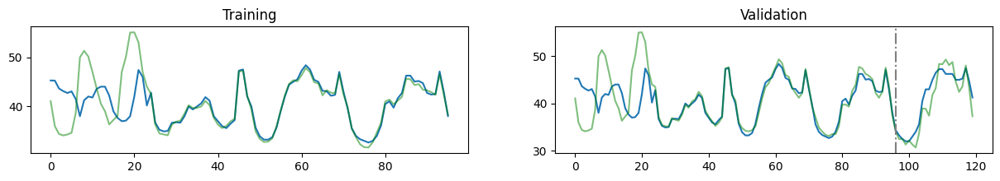

Step: 3 | Iteration 50| Training Loss: 2.0151097774505615 | Validation Loss: 1.8508590459823608 | Number of func evals: 321568


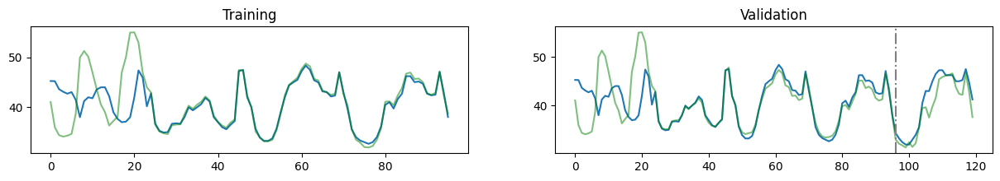

================================================== Window: 11 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 2.0418245792388916 | Validation Loss: 1.594648838043213 | Number of func evals: 189674


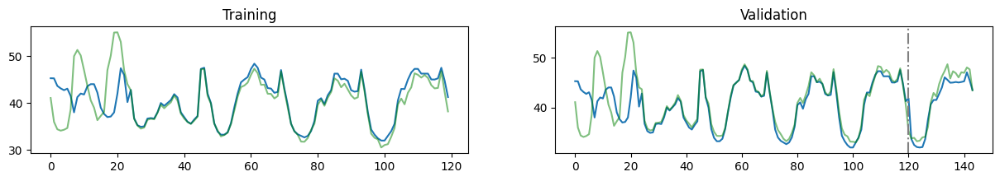

Step: 4 | Iteration 50| Training Loss: 1.7963563203811646 | Validation Loss: 1.9654005765914917 | Number of func evals: 382540


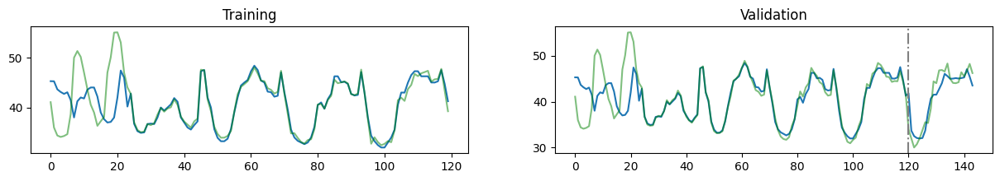

================================================== Window: 11 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.6619609594345093 | Validation Loss: 2.9201278686523438 | Number of func evals: 212118


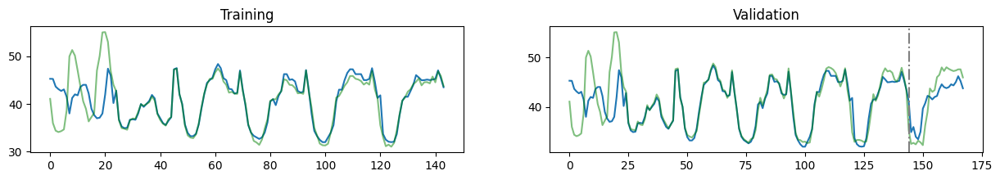

Step: 5 | Iteration 50| Training Loss: 1.8071746826171875 | Validation Loss: 2.5496914386749268 | Number of func evals: 437374


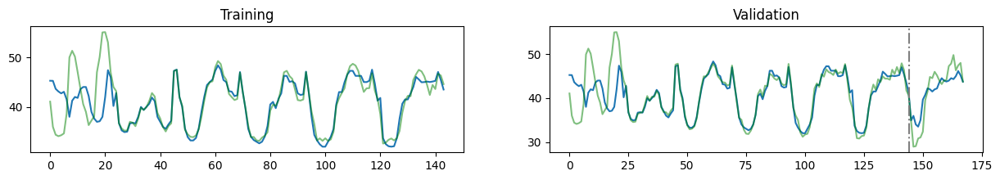

================================================== Window: 11 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.6197128295898438 | Validation Loss: 4.740846157073975 | Number of func evals: 238108


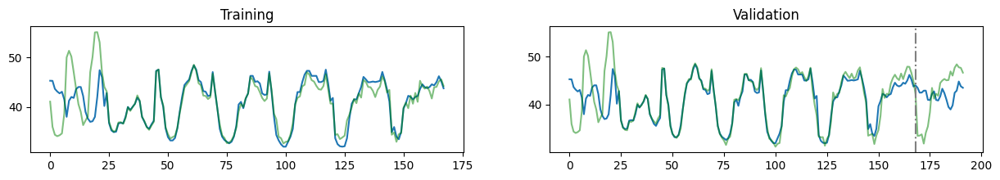

Step: 6 | Iteration 50| Training Loss: 1.505602478981018 | Validation Loss: 3.642690658569336 | Number of func evals: 475104


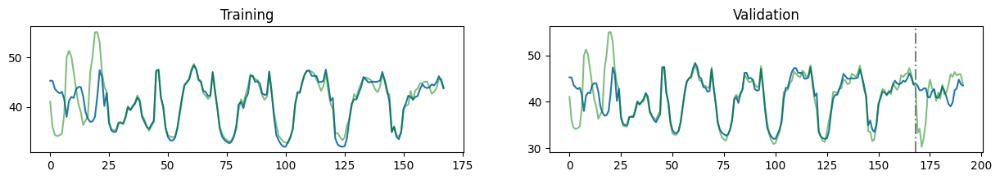

================================================== Window: 12 | Step: 1 ==================================================
Step: 1 | Iteration 25| Training Loss: 4.490311145782471 | Validation Loss: 2.8924551010131836 | Number of func evals: 69110


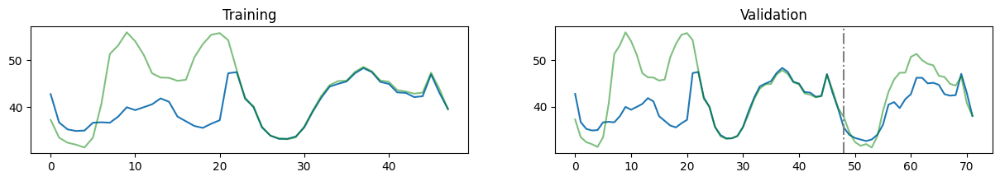

Step: 1 | Iteration 50| Training Loss: 4.390158176422119 | Validation Loss: 3.0535526275634766 | Number of func evals: 139606


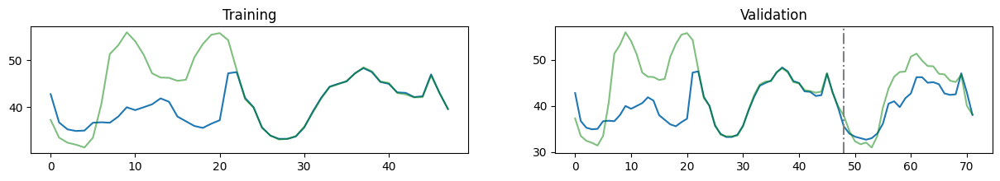

================================================== Window: 12 | Step: 2 ==================================================
Step: 2 | Iteration 25| Training Loss: 3.166213035583496 | Validation Loss: 1.6508909463882446 | Number of func evals: 91684


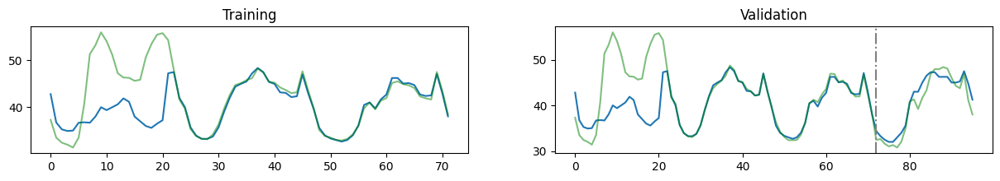

Step: 2 | Iteration 50| Training Loss: 3.1167688369750977 | Validation Loss: 1.8735662698745728 | Number of func evals: 188540


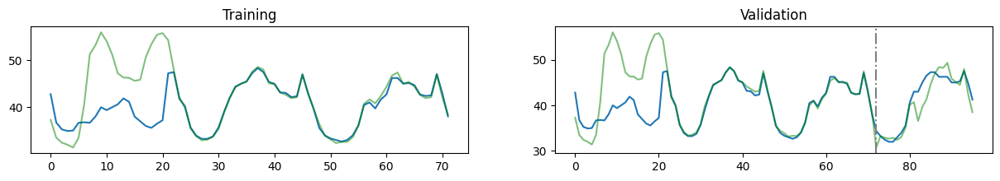

================================================== Window: 12 | Step: 3 ==================================================
Step: 3 | Iteration 25| Training Loss: 2.5186660289764404 | Validation Loss: 2.3008415699005127 | Number of func evals: 118366


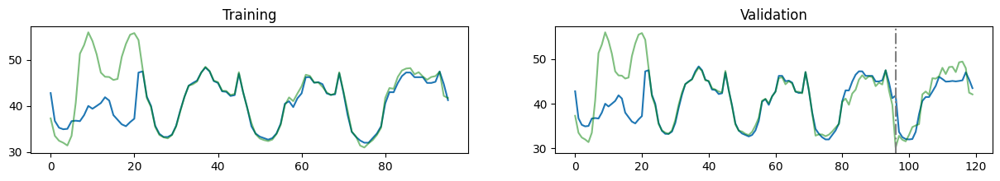

Step: 3 | Iteration 50| Training Loss: 2.4139015674591064 | Validation Loss: 2.7113876342773438 | Number of func evals: 240668


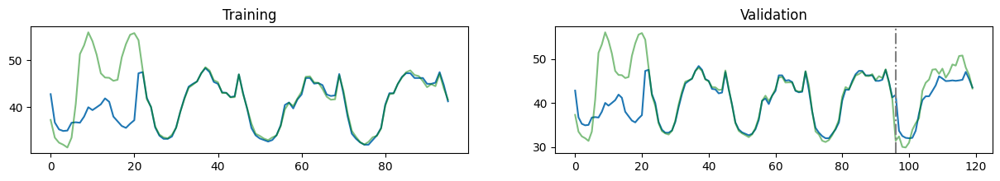

================================================== Window: 12 | Step: 4 ==================================================
Step: 4 | Iteration 25| Training Loss: 2.100567579269409 | Validation Loss: 1.888367772102356 | Number of func evals: 166164


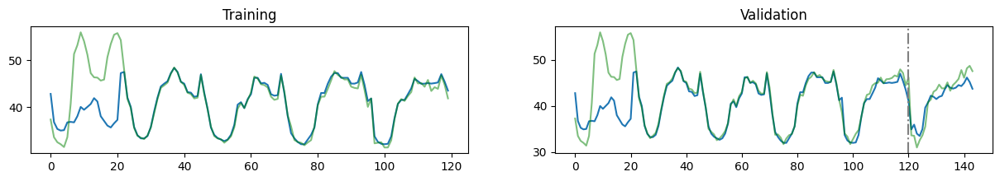

Step: 4 | Iteration 50| Training Loss: 2.1014175415039062 | Validation Loss: 1.8508925437927246 | Number of func evals: 338300


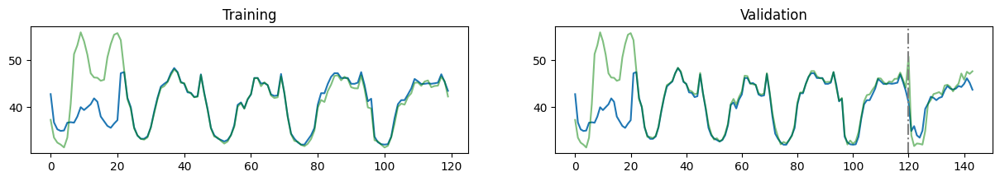

================================================== Window: 12 | Step: 5 ==================================================
Step: 5 | Iteration 25| Training Loss: 1.9649630784988403 | Validation Loss: 3.1691863536834717 | Number of func evals: 182970


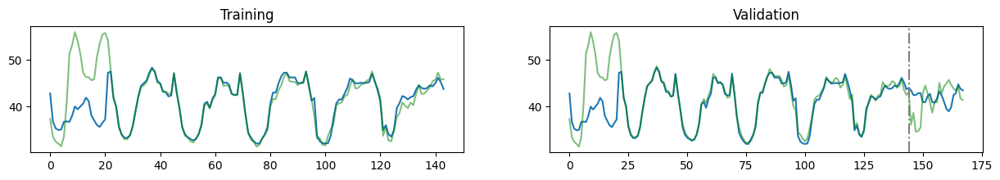

Step: 5 | Iteration 50| Training Loss: 1.914722204208374 | Validation Loss: 3.748525619506836 | Number of func evals: 368858


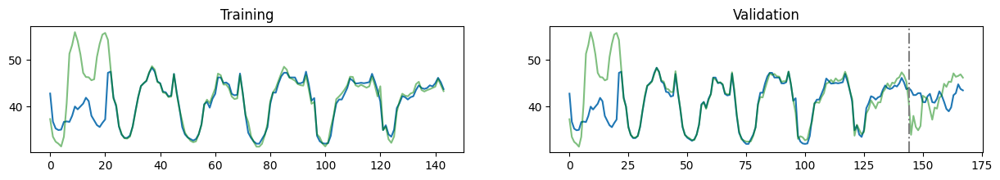

================================================== Window: 12 | Step: 6 ==================================================
Step: 6 | Iteration 25| Training Loss: 1.8139684200286865 | Validation Loss: 5.7150726318359375 | Number of func evals: 199138


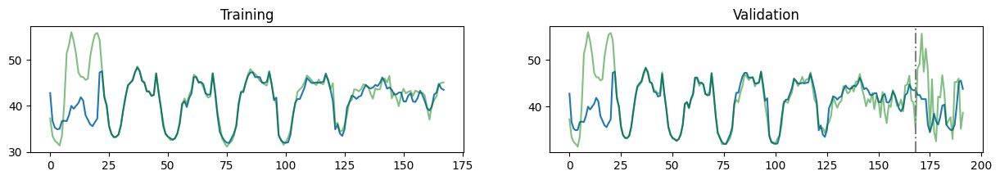

Step: 6 | Iteration 50| Training Loss: 1.7534114122390747 | Validation Loss: 6.0277886390686035 | Number of func evals: 410682


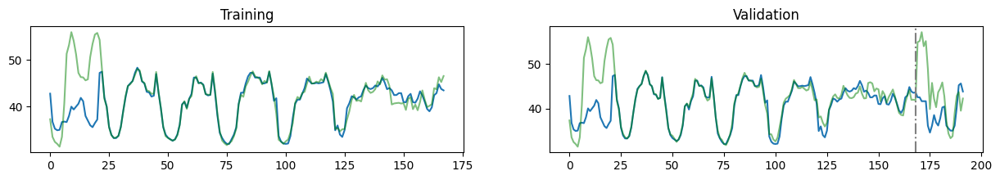

In [19]:
# Checking if CUDA is available
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

# Model and optimizer definition   
func = ODEFunc(input_size=72, hidden_layer_neurons=200, output_size=72)
optimizer = optim.RMSprop(func.parameters(), lr=LEARNING_RATE)

# Mean absolute error loss function
loss_fn = nn.L1Loss()

train_losses = [] # For storing the loss value during training
valid_losses = [] # For storing the loss value during eval
loss_eval_original = []
best_eval_accuracy = []
best_train_loss = float('inf')  # initializing to infinity
best_valid_loss = float('inf')  # initializing to infinity
nfe_history = {}  # For storing number of function evaluations during training
nfe_history_eval = {}  # For storing number of function evaluations during evaluation

for j in range(train_num_windows):
    nfe_history[j] = {}
    nfe_history_eval[j] = {}

    for i in range(1, TRAIN_STEPS+1):
        # Resetting the function evaluations counter at the beginning of each step within window
        func.nfe = 0
        nfe_history[j][i] = {}

        # Train
        train_loss = 0
        func.train()
        print("="* 50 + f" Window: {j+1} | Step: {i} " + "="*50)
        batch_y0 = train_spot_tensor[72*j:72*(j+1)] # y0
        batch_t = torch.from_numpy(np.arange(0, i+1, dtype=float)) # [0, ..., i]
        
        # Train neural ODE N_ITR times
        for itr in range(1, N_ITR+1):
            optimizer.zero_grad()

            # Next time-step ODE computation
            pred_data = odeint(func=func, y0=batch_y0, t=batch_t, method = 'fehlberg2').to(device) # pred_data shape: (i+1, 72)
            
            # Computing the training loss
            loss = loss_fn(pred_data[:, -24:].flatten(), price_tensor[j*24:(j+i+1)*24])
            loss.backward()
            optimizer.step()

            # Inverse scaling the forecast and actual values to compute the loss in the original scale
            loss_train_original = loss_fn(torch.tensor(inverse_transform(pred_data[:, -24:].flatten(), scaler_price)), torch.tensor(inverse_transform(price_tensor[j*24:(j+i+1)*24], scaler_price)))
            train_loss += loss_train_original.item()
            nfe_history[j][i][itr] = func.nfe

            if itr % (N_ITR // 2) == 0:
                # Evaluation
                valid_loss = 0
                loss_eval_original = 0

                with torch.no_grad():
                    nfe_before_eval = func.nfe
                    func.eval() # eval mode
                    batch_t_eval = torch.from_numpy(np.arange(0, i+1+TEST_SIZE, dtype=float))  # [0, ..., i+TEST_SIZE]
                    
                    # After training for N_ITR epochs, it is time to evaluate on the following time step (out-of-sample forecast)
                    pred_data_eval = odeint(func, batch_y0, batch_t_eval, method = 'fehlberg2')  # pred_data_eval shape: (i+1+TEST_SIZE, 72)
                    loss_eval = loss_fn(pred_data_eval[-TEST_SIZE:, -24:].flatten(), price_tensor[24*(j+i+1):24*(j+i+1+TEST_SIZE)])
                    valid_loss += loss_eval.item()

                    # Inverse scaling the forecast and actual values to compute the loss in the original scale
                    loss_eval_transformed = loss_fn(torch.from_numpy(inverse_transform(pred_data_eval[-TEST_SIZE:, -24:].flatten(), scaler_price)), torch.tensor(inverse_transform(price_tensor[24*(j+i+1):24*(j+i+1+TEST_SIZE)], scaler_price)))
                    nfe_after_eval = func.nfe  # storing the number of function evaluations after evaluation
                    nfe_eval = nfe_after_eval - nfe_before_eval  # calculating the number of function evaluations during evaluation
                    nfe_history_eval[j][i] = nfe_eval  # storing the number of function evaluations during evaluation
                    
                    # Computing the eval loss
                    loss_eval_original += loss_eval_transformed.item()

                    print(f"Step: {i} | Iteration {itr}| Training Loss: {loss_train_original.item()} | Validation Loss: {loss_eval_transformed.item()} | Number of func evals: {nfe_history[j][i][itr]}")

                    if itr == 30 and i == TRAIN_STEPS:
                        best_eval_accuracy.append(loss_eval_original)
                      
                    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 2))
                    
                    # Inverse transforming before plotting Training
                    ax0.plot(inverse_transform(price_tensor[j*24:(j+i+1)*24], scaler_price))
                    ax0.plot(inverse_transform(pred_data[:, -24:].flatten().detach(), scaler_price), color="green", alpha=.5)
                    ax0.set_title("Training")
                    
                    # Inverse transforming before plotting Validation
                    ax1.plot(inverse_transform(price_tensor[24*j:24*(j+i+1+TEST_SIZE)], scaler_price))
                    ax1.plot(inverse_transform(pred_data_eval[:, -24:].flatten().detach(), scaler_price), color="green", alpha=.5)
                    ax1.set_title("Validation")
                    ax1.axvline(x=24*(i+1), color="grey", ls="dashdot")
                    plt.show()
            
                func.train() # back to training mode where backpropgation will be perfomed (via the adjoint sensitivity method)
            
        train_losses.append(best_train_loss)
        valid_losses.append(best_valid_loss)

        # Appending the number of function evaluations to the history at the end of each step of a window
        nfe_history[j][i]["total"] = func.nfe
        train_losses.append(best_train_loss)
        valid_losses.append(best_valid_loss)

In [20]:
price_tensor.shape

torch.Size([2040])

In [21]:
best_eval_accuracy

[]

In [22]:
# loop to sum all values
res = 0
for val in best_eval_accuracy:
    res += val
 
# using len() to get total keys for mean computation
res = res / len(best_eval_accuracy)
 
# printing result
print("The computed mean error is: " + str(res))

ZeroDivisionError: division by zero

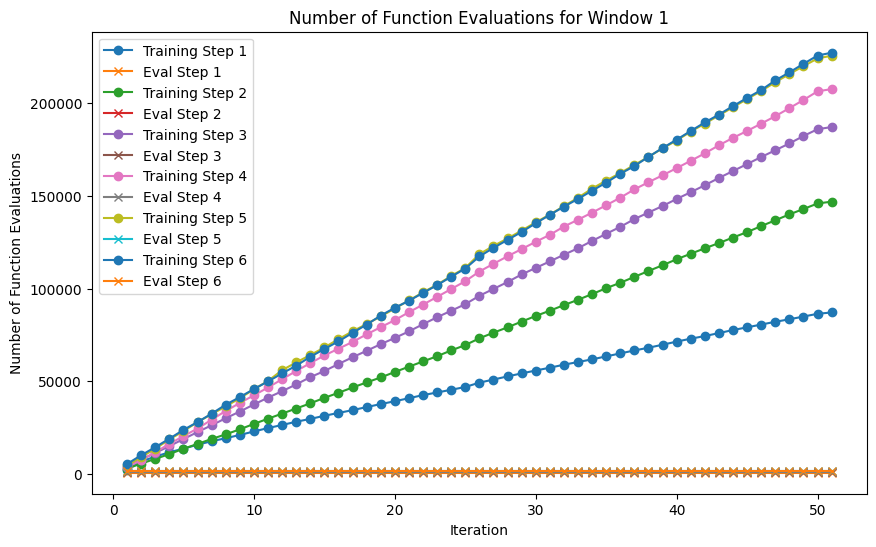

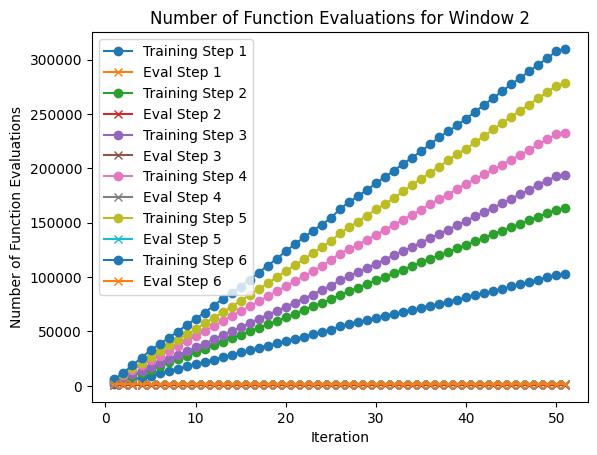

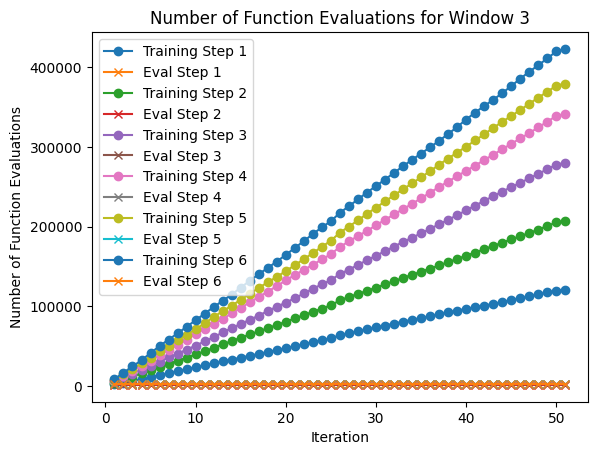

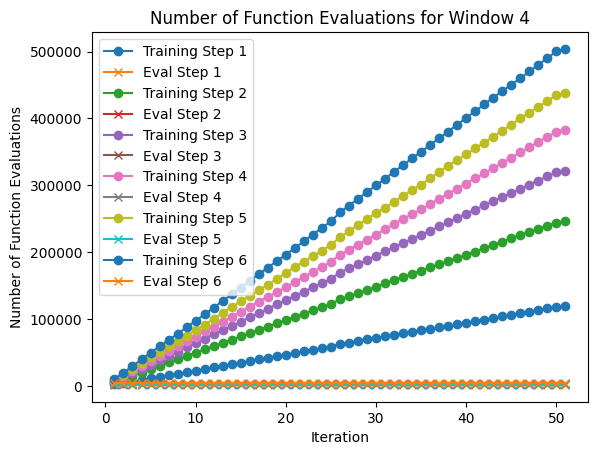

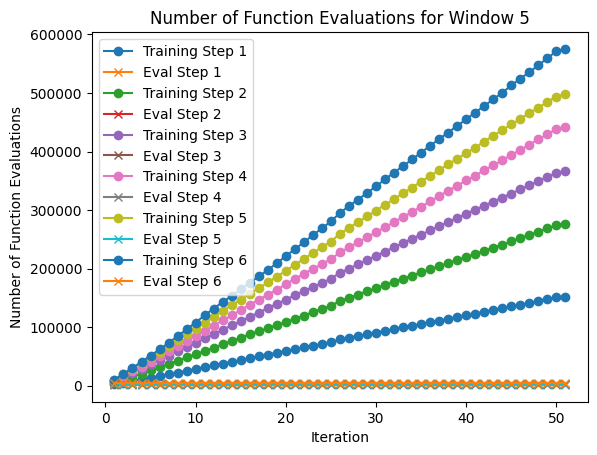

...

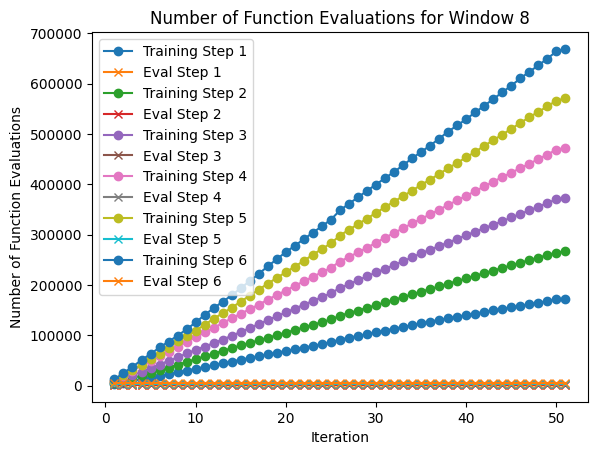

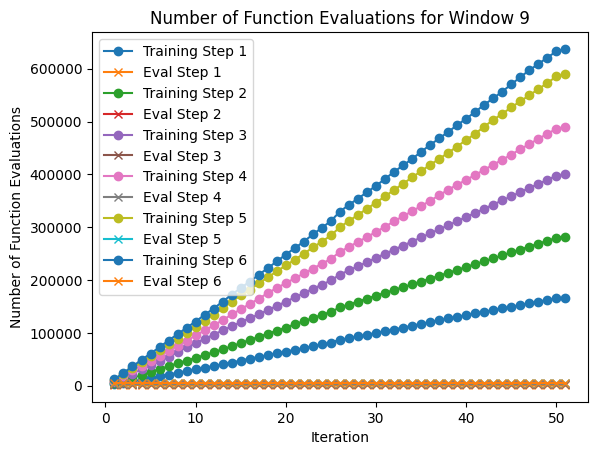

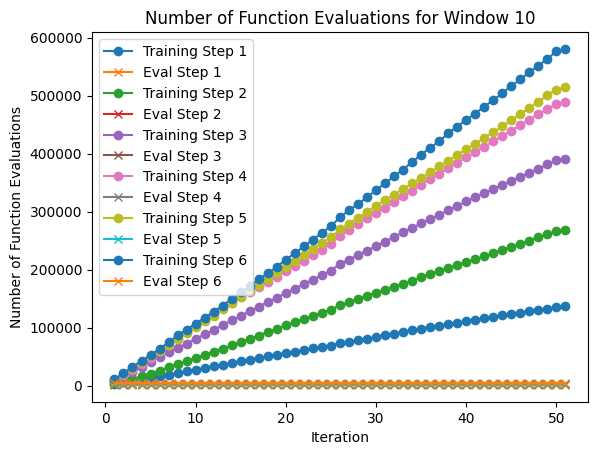

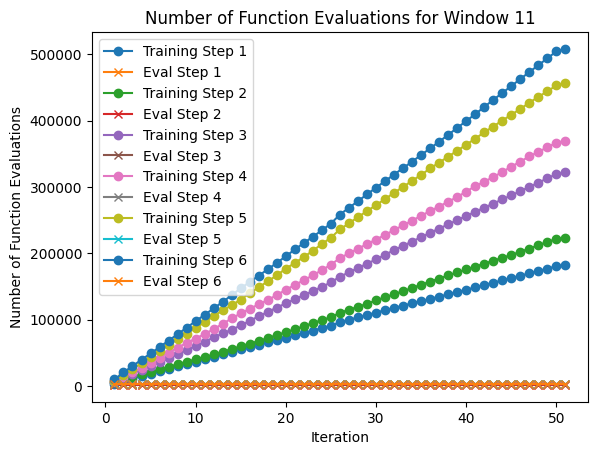

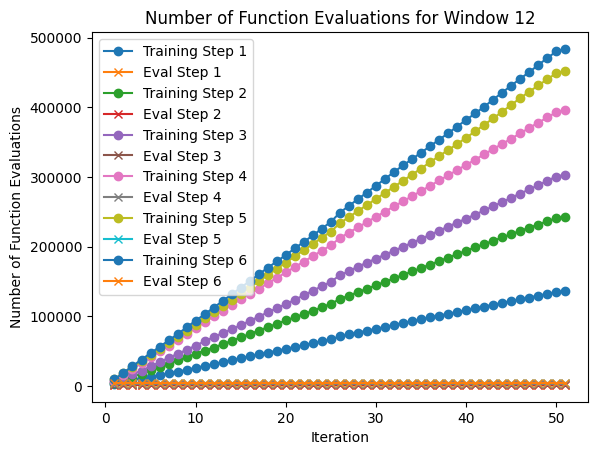

In [ ]:
plt.figure(figsize=(10, 6))
for j in range(train_num_windows):
    for i in nfe_history[j].keys():
        nfe_list_train = list(nfe_history[j][i].values())
        nfe_list_eval = [nfe_history_eval[j][i]] * len(nfe_list_train)  # extend the single eval count across the iterations
        plt.plot(range(1, len(nfe_list_train)+1), nfe_list_train, marker='o', linestyle='-', label=f'Training Step {i}')
        plt.plot(range(1, len(nfe_list_eval)+1), nfe_list_eval, marker='x', linestyle='-', label=f'Eval Step {i}')
    plt.xlabel("Iteration")
    plt.ylabel("Number of Function Evaluations")
    plt.title(f"Number of Function Evaluations for Window {j+1}")
    plt.legend()
    plt.show()

In [ ]:
# test_spot_tensor

In [ ]:
# Last Validation Step
fig, ax = plt.subplots()
ax.plot(price_tensor[24*(i+1):24*(i+1+TEST_SIZE)].detach().numpy(), label='Actual')
ax.plot(pred_data_eval[-TEST_SIZE:, -24:].flatten(), label='Predicted')
ax.set_title('Last Validation Step')
ax.set_xlabel('Time')
ax.set_ylabel('Price')
ax.legend()
plt.show()